# Food Delivery Time Prediction Using Regression Models.

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
df = pd.read_csv("food_delivery.csv", encoding='latin1')

In [4]:
df.head()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Type_of_order,Type_of_vehicle,Time_taken(min)
0,4607,INDORES13DEL02,37,4.9,22.745049,75.892471,22.765049,75.912471,Snack,motorcycle,24
1,B379,BANGRES18DEL02,34,4.5,12.913041,77.683237,13.043041,77.813237,Snack,scooter,33
2,5D6D,BANGRES19DEL01,23,4.4,12.914264,77.678400,12.924264,77.688400,Drinks,motorcycle,26
3,7A6A,COIMBRES13DEL02,38,4.7,11.003669,76.976494,11.053669,77.026494,Buffet,motorcycle,21
4,70A2,CHENRES12DEL01,32,4.6,12.972793,80.249982,13.012793,80.289982,Snack,scooter,30


In [5]:
df.tail()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Type_of_order,Type_of_vehicle,Time_taken(min)
45588,7C09,JAPRES04DEL01,30,4.8,26.902328,75.794257,26.912328,75.804257,Meal,motorcycle,32
45589,D641,AGRRES16DEL01,21,4.6,0.000000,0.000000,0.070000,0.070000,Buffet,motorcycle,36
45590,4F8D,CHENRES08DEL03,30,4.9,13.022394,80.242439,13.052394,80.272439,Drinks,scooter,16
45591,5EEE,COIMBRES11DEL01,20,4.7,11.001753,76.986241,11.041753,77.026241,Snack,motorcycle,26
45592,5FB2,RANCHIRES09DEL02,23,4.9,23.351058,85.325731,23.431058,85.405731,Snack,scooter,36


In [6]:
df.shape

(45593, 11)

In [7]:
df.columns

Index(['ID', 'Delivery_person_ID', 'Delivery_person_Age',
       'Delivery_person_Ratings', 'Restaurant_latitude',
       'Restaurant_longitude', 'Delivery_location_latitude',
       'Delivery_location_longitude', 'Type_of_order', 'Type_of_vehicle',
       'Time_taken(min)'],
      dtype='object')

In [8]:
df.duplicated().sum()

0

In [9]:
df.isnull().sum()

ID                             0
Delivery_person_ID             0
Delivery_person_Age            0
Delivery_person_Ratings        0
Restaurant_latitude            0
Restaurant_longitude           0
Delivery_location_latitude     0
Delivery_location_longitude    0
Type_of_order                  0
Type_of_vehicle                0
Time_taken(min)                0
dtype: int64

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45593 entries, 0 to 45592
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   ID                           45593 non-null  object 
 1   Delivery_person_ID           45593 non-null  object 
 2   Delivery_person_Age          45593 non-null  int64  
 3   Delivery_person_Ratings      45593 non-null  float64
 4   Restaurant_latitude          45593 non-null  float64
 5   Restaurant_longitude         45593 non-null  float64
 6   Delivery_location_latitude   45593 non-null  float64
 7   Delivery_location_longitude  45593 non-null  float64
 8   Type_of_order                45593 non-null  object 
 9   Type_of_vehicle              45593 non-null  object 
 10  Time_taken(min)              45593 non-null  int64  
dtypes: float64(5), int64(2), object(4)
memory usage: 3.8+ MB


In [11]:
df.describe()

,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Time_taken(min)
count,45593.000000,45593.000000,45593.000000,45593.000000,45593.000000,45593.000000,45593.000000
mean,29.544075,4.632367,17.017729,70.231332,17.465186,70.845702,26.294607
std,5.696793,0.327708,8.185109,22.883647,7.335122,21.118812,9.383806
min,15.000000,1.000000,-30.905562,-88.366217,0.010000,0.010000,10.000000
25%,25.000000,4.600000,12.933284,73.170000,12.988453,73.280000,19.000000
50%,29.000000,4.700000,18.546947,75.898497,18.633934,76.002574,26.000000
75%,34.000000,4.800000,22.728163,78.044095,22.785049,78.107044,32.000000
max,50.000000,6.000000,30.914057,88.433452,31.054057,88.563452,54.000000


In [12]:
df.nunique()

ID                             45451
Delivery_person_ID              1320
Delivery_person_Age               22
Delivery_person_Ratings           28
Restaurant_latitude              657
Restaurant_longitude             518
Delivery_location_latitude      4373
Delivery_location_longitude     4373
Type_of_order                      4
Type_of_vehicle                    4
Time_taken(min)                   45
dtype: int64

In [13]:
object_columns = df.select_dtypes(include='object').columns
print("Object Columns:")
print(object_columns)
print()

numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns
print("Numerical Columns:")
print(numerical_columns)

Object Columns:
Index(['ID', 'Delivery_person_ID', 'Type_of_order', 'Type_of_vehicle'], dtype='object')

Numerical Columns:
Index(['Delivery_person_Age', 'Delivery_person_Ratings', 'Restaurant_latitude',
       'Restaurant_longitude', 'Delivery_location_latitude',
       'Delivery_location_longitude', 'Time_taken(min)'],
      dtype='object')


In [14]:
df['Type_of_order'].unique()

array(['Snack ', 'Drinks ', 'Buffet ', 'Meal '], dtype=object)

In [15]:
df['Type_of_order'].value_counts()

Snack      11533
Meal       11458
Drinks     11322
Buffet     11280
Name: Type_of_order, dtype: int64

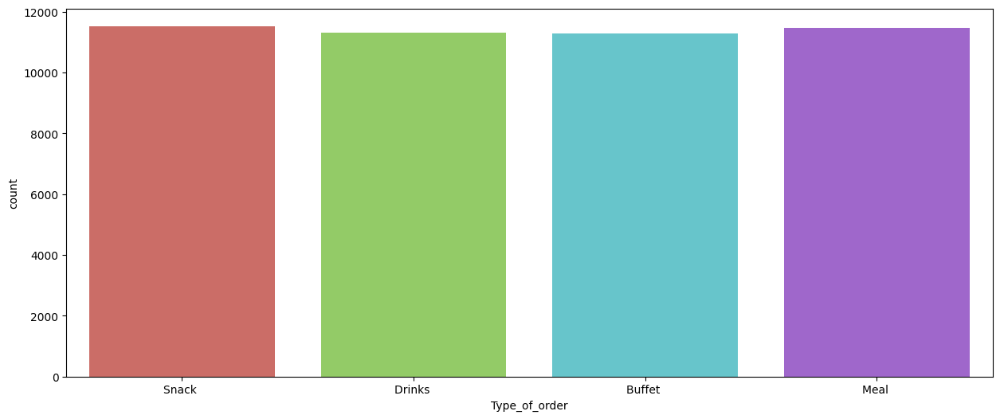

In [16]:
plt.figure(figsize=(15,6))
sns.countplot(x='Type_of_order', data=df, palette='hls')
plt.xticks(rotation=0)
plt.show()


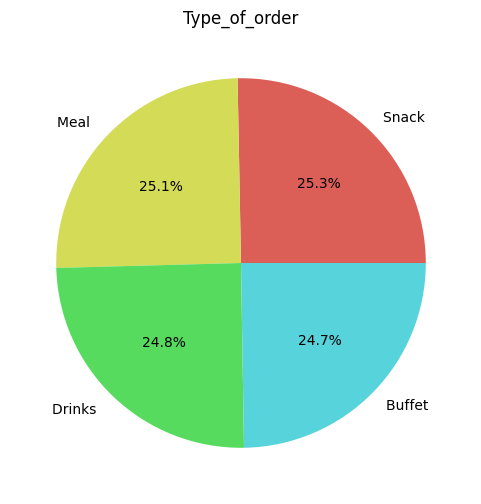

In [17]:
plt.figure(figsize=(15, 6))
counts = df['Type_of_order'].value_counts()
plt.pie(counts, labels=counts.index, autopct='%1.1f%%', colors=sns.color_palette('hls'))
plt.title('Type_of_order')
plt.show()

In [18]:
import plotly.graph_objects as go

In [19]:
fig = go.Figure(data=[go.Bar(x=df['Type_of_order'].value_counts().index, y=df['Type_of_order'].value_counts())])
fig.update_layout(
        title= 'Type_of_order',
        xaxis_title="Categories",
        yaxis_title="Count"
    )
fig.show()

In [20]:
counts = df['Type_of_order'].value_counts()
fig = go.Figure(data=[go.Pie(labels=counts.index, values=counts)])
fig.update_layout(title= 'Type_of_order')
fig.show()

In [21]:
df['Type_of_vehicle'].unique()

array(['motorcycle ', 'scooter ', 'electric_scooter ', 'bicycle '],
      dtype=object)

In [22]:
df['Type_of_vehicle'].value_counts()

motorcycle           26435
scooter              15276
electric_scooter      3814
bicycle                 68
Name: Type_of_vehicle, dtype: int64

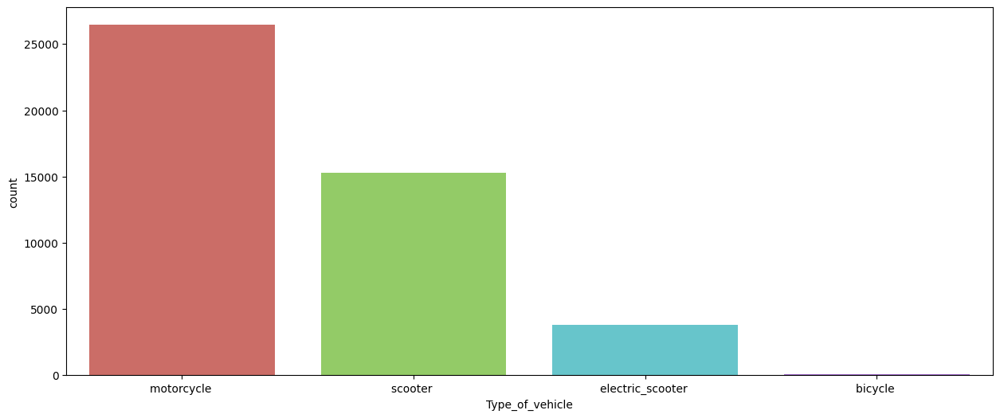

In [23]:
plt.figure(figsize=(15,6))
sns.countplot(x='Type_of_vehicle', data=df, palette='hls')
plt.xticks(rotation=0)
plt.show()


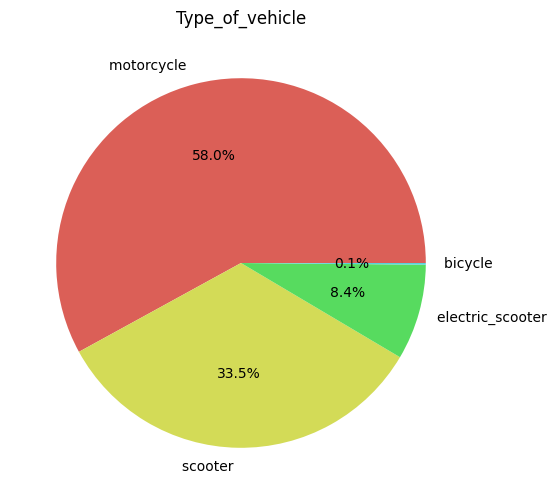

In [24]:
plt.figure(figsize=(15, 6))
counts = df['Type_of_vehicle'].value_counts()
plt.pie(counts, labels=counts.index, autopct='%1.1f%%', colors=sns.color_palette('hls'))
plt.title('Type_of_vehicle')
plt.show()

In [25]:
fig = go.Figure(data=[go.Bar(x=df['Type_of_vehicle'].value_counts().index, y=df['Type_of_vehicle'].value_counts())])
fig.update_layout(
        title= 'Type_of_vehicle',
        xaxis_title="Categories",
        yaxis_title="Count"
    )
fig.show()

In [26]:
counts = df['Type_of_vehicle'].value_counts()
fig = go.Figure(data=[go.Pie(labels=counts.index, values=counts)])
fig.update_layout(title= 'Type_of_vehicle')
fig.show()

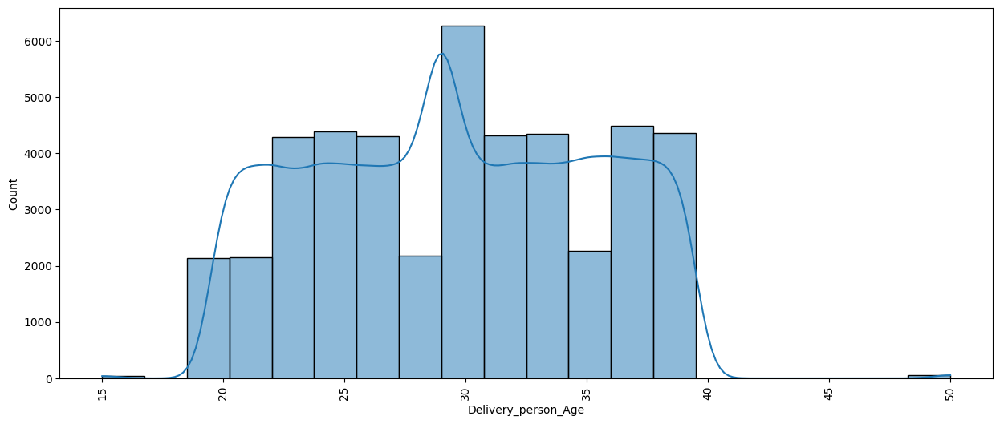

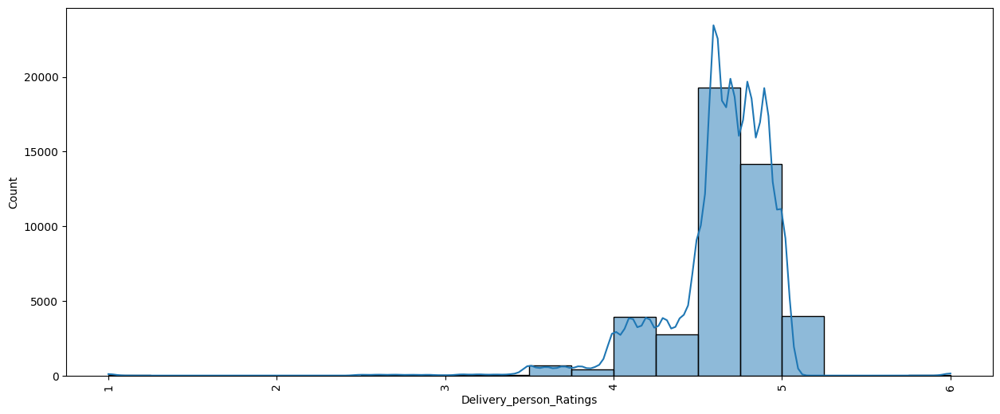

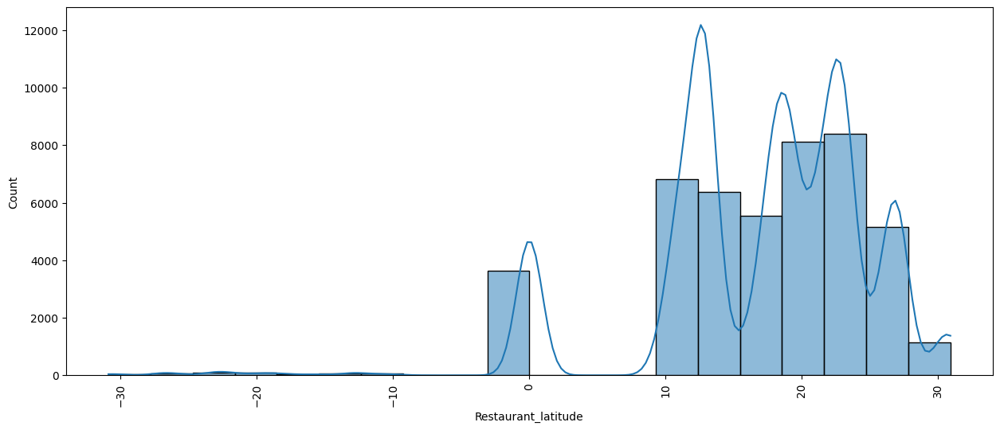

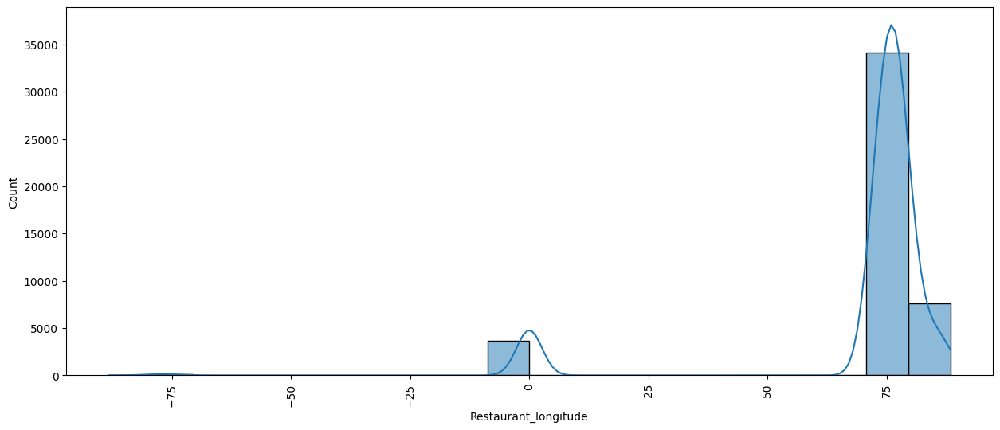

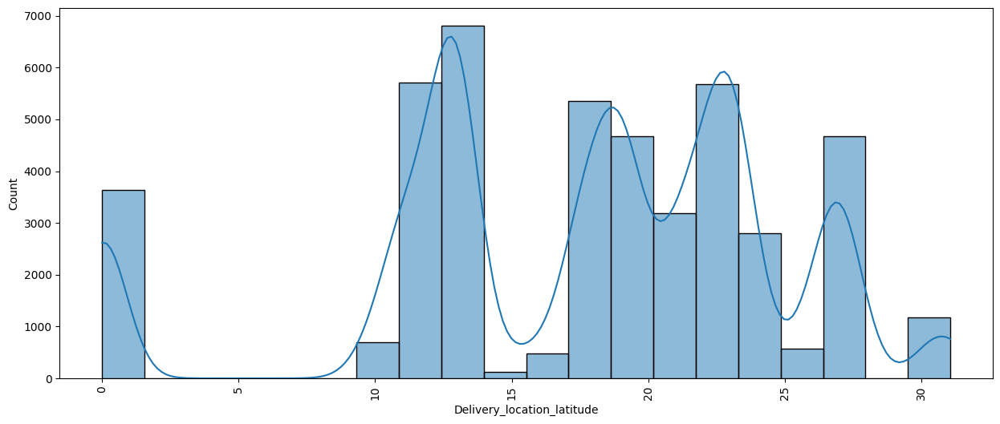

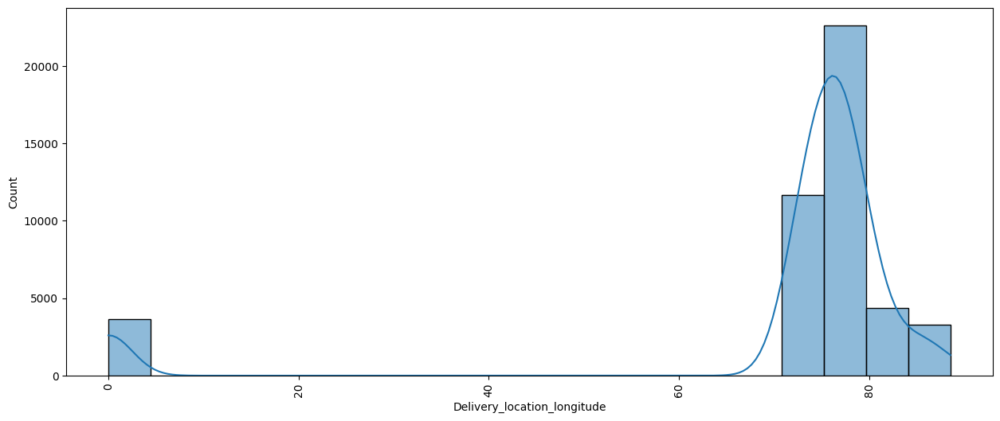

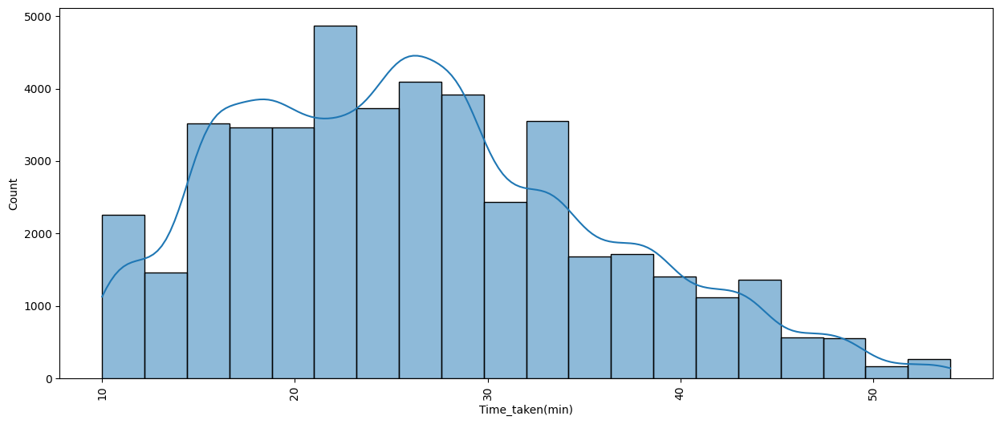

In [27]:
for i in numerical_columns:
    plt.figure(figsize=(15,6))
    sns.histplot(df[i], kde = True, bins = 20, palette = 'hls')
    plt.xticks(rotation = 90)
    plt.show()

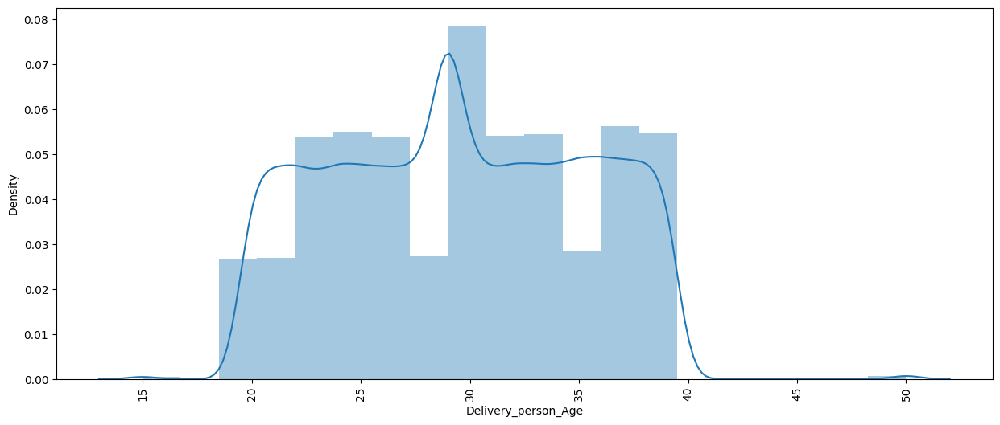

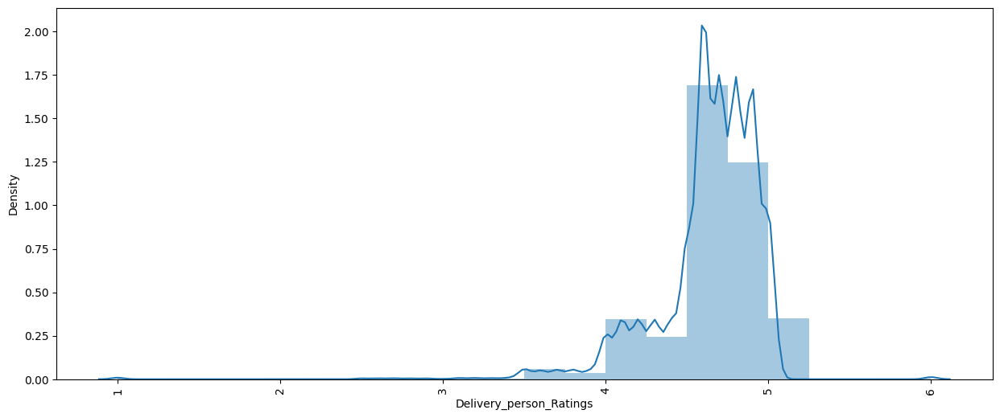

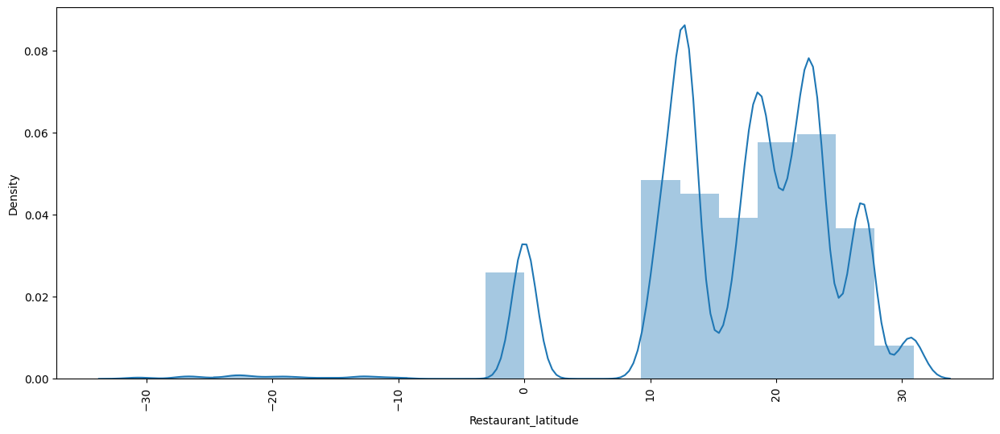

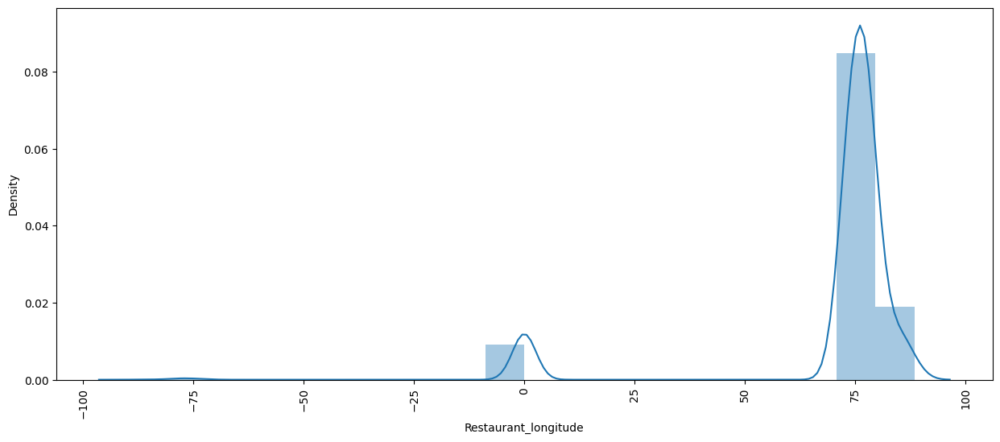

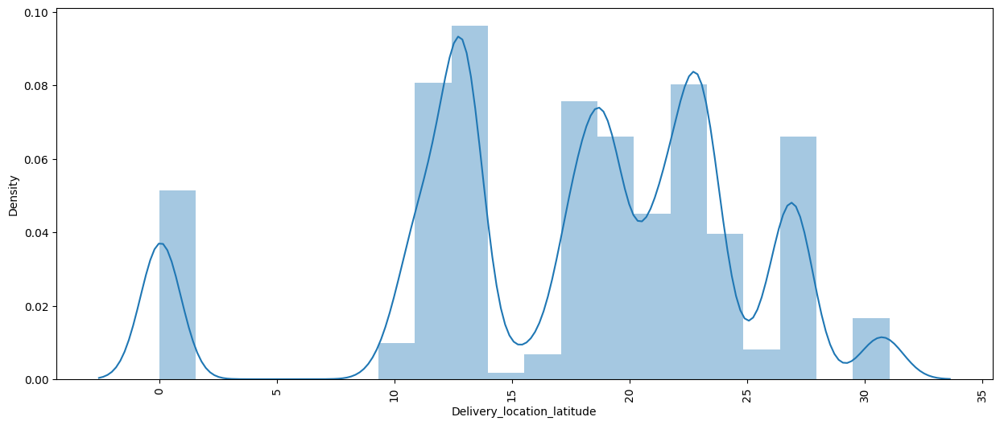

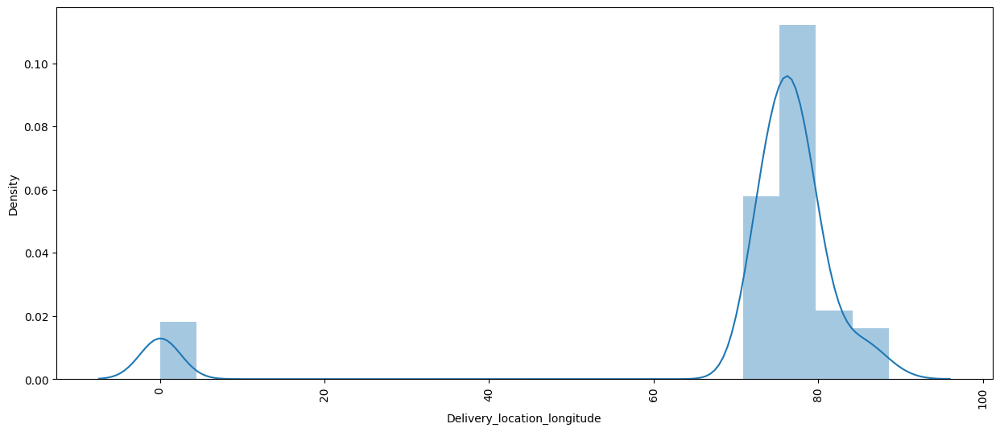

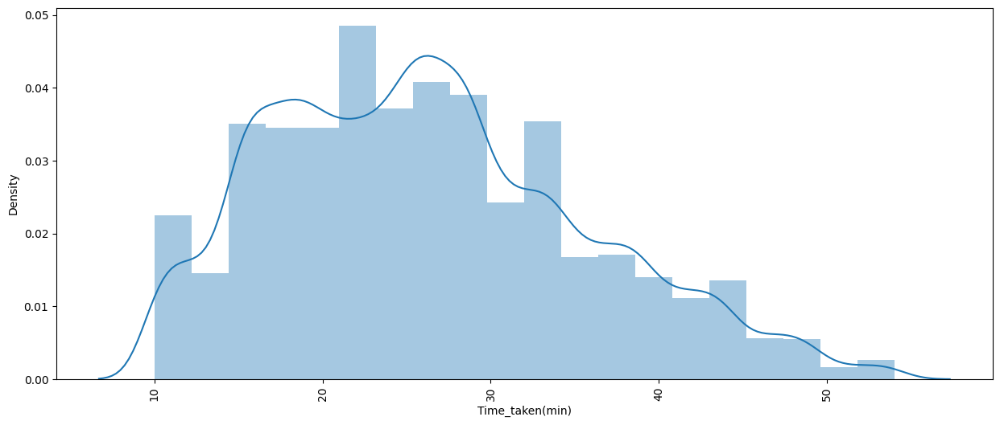

In [28]:
for i in numerical_columns:
    plt.figure(figsize=(15,6))
    sns.distplot(df[i], kde = True, bins = 20)
    plt.xticks(rotation = 90)
    plt.show()

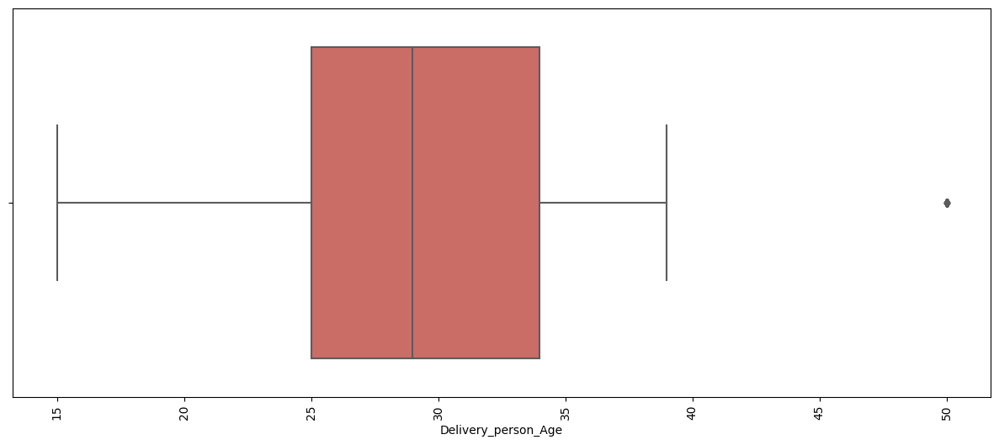

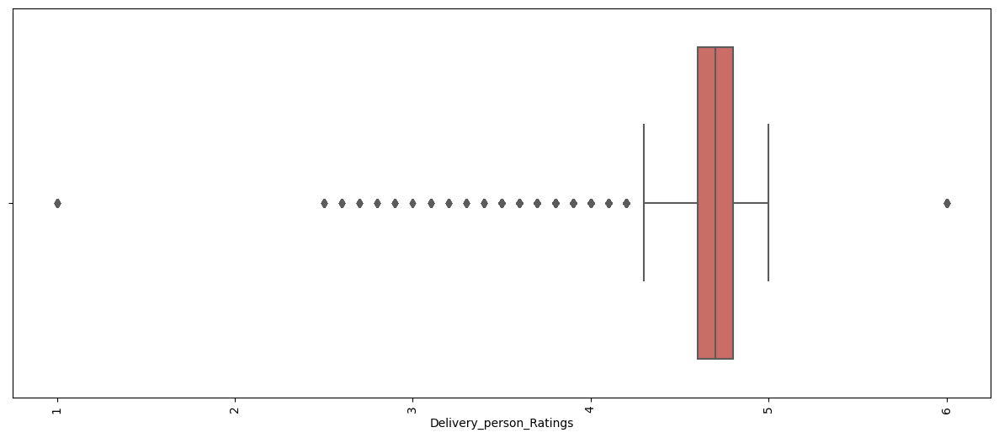

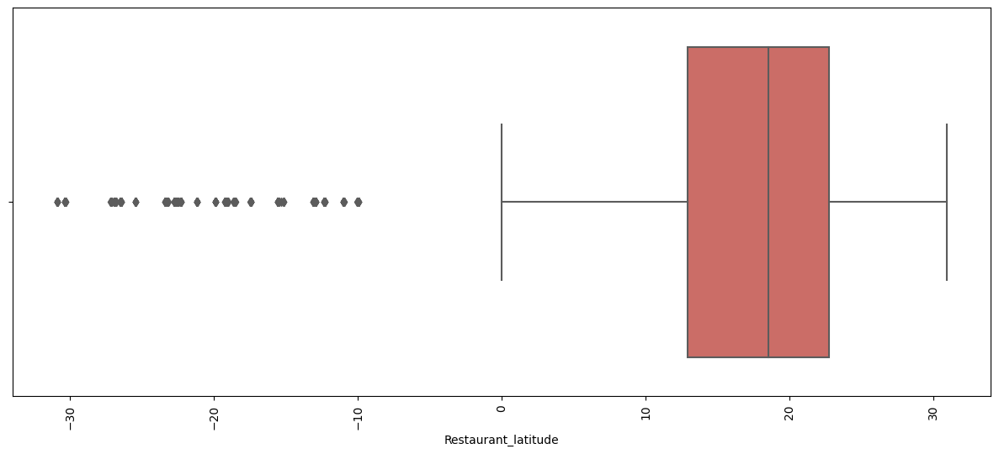

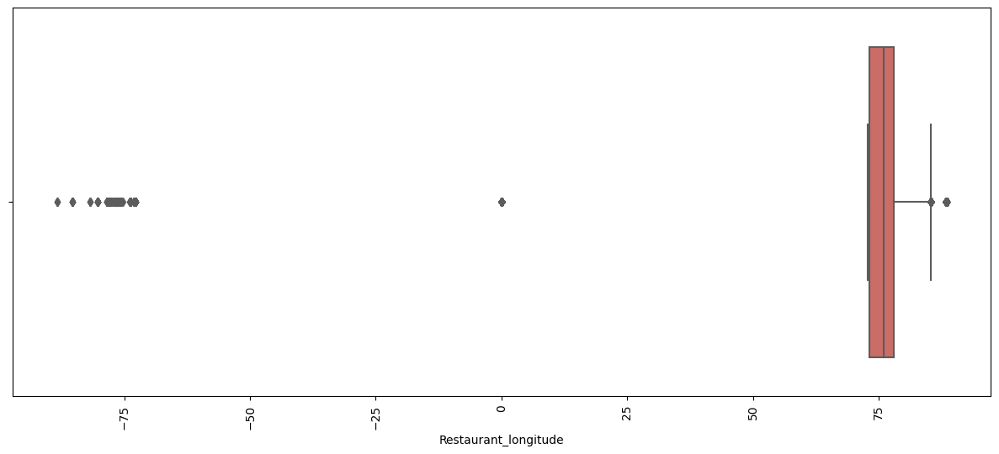

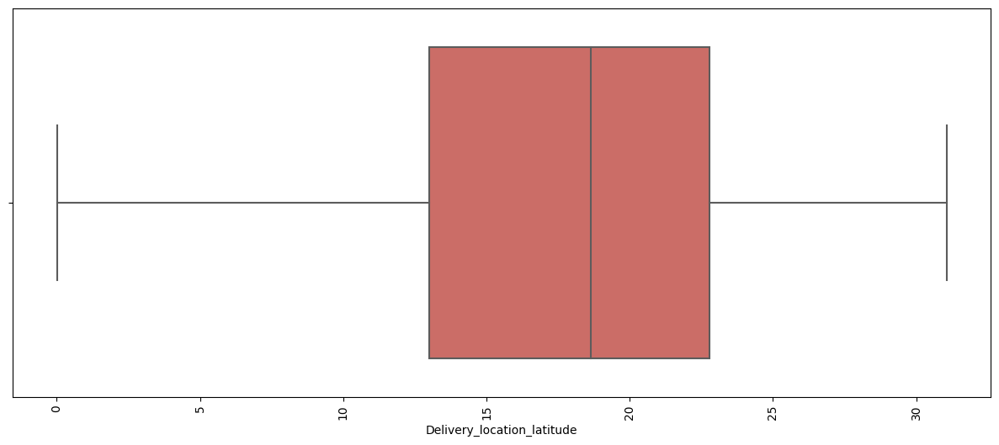

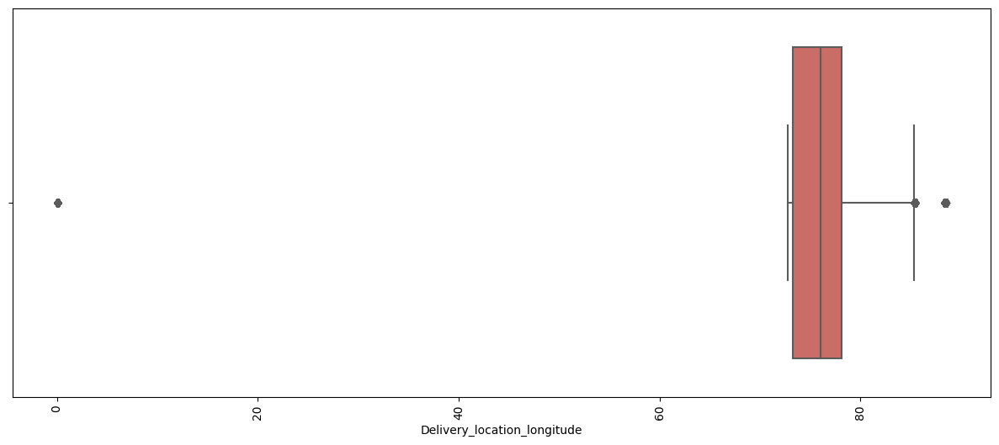

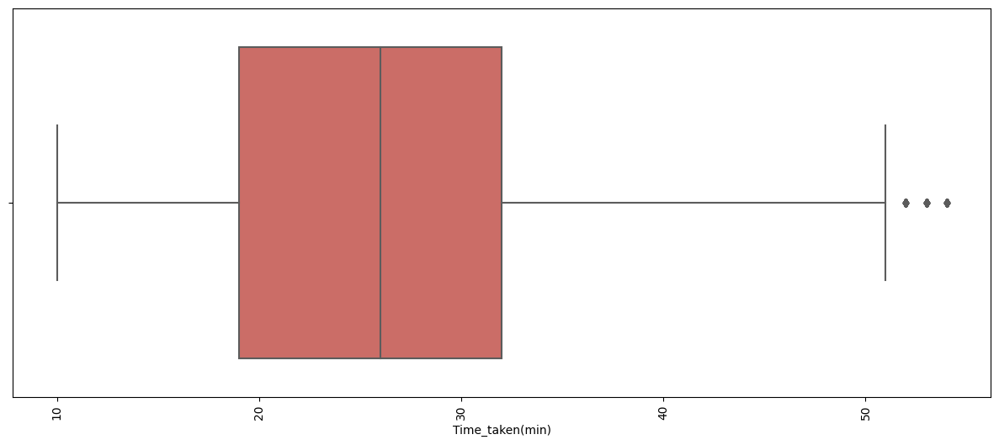

In [29]:
for i in numerical_columns:
    plt.figure(figsize=(15, 6))
    sns.boxplot(x=i, data=df, palette='hls')
    plt.xticks(rotation=90)
    plt.show()


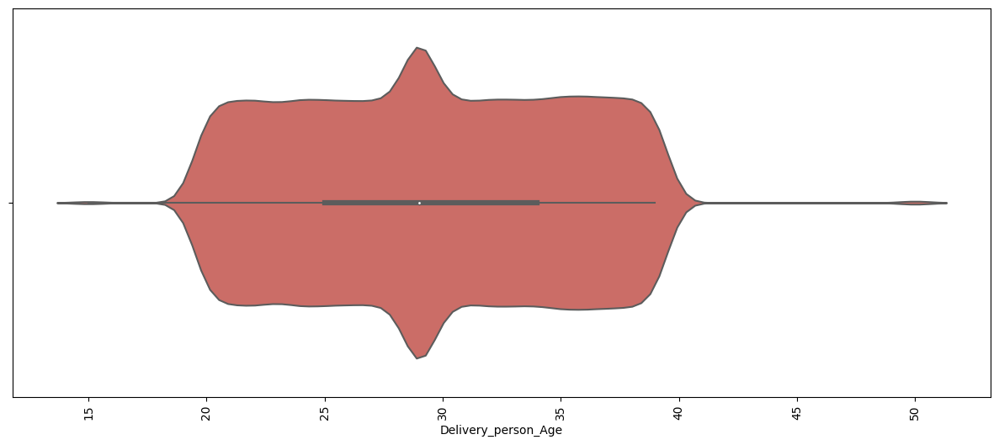

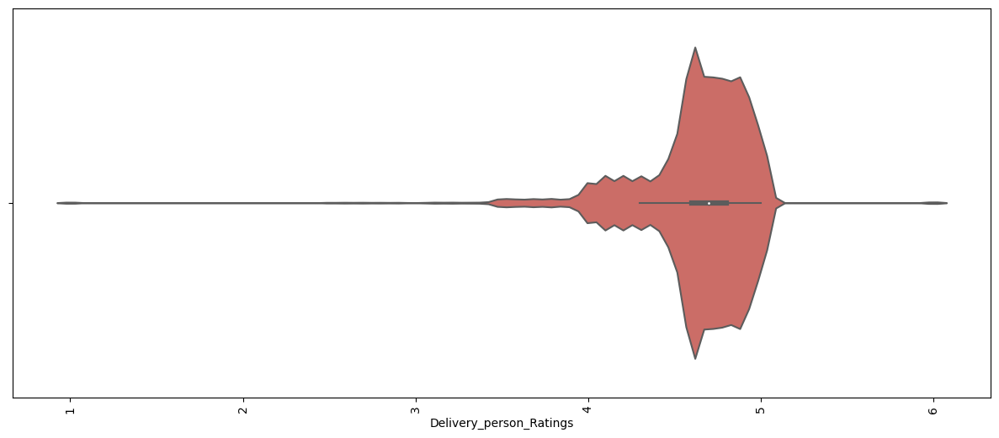

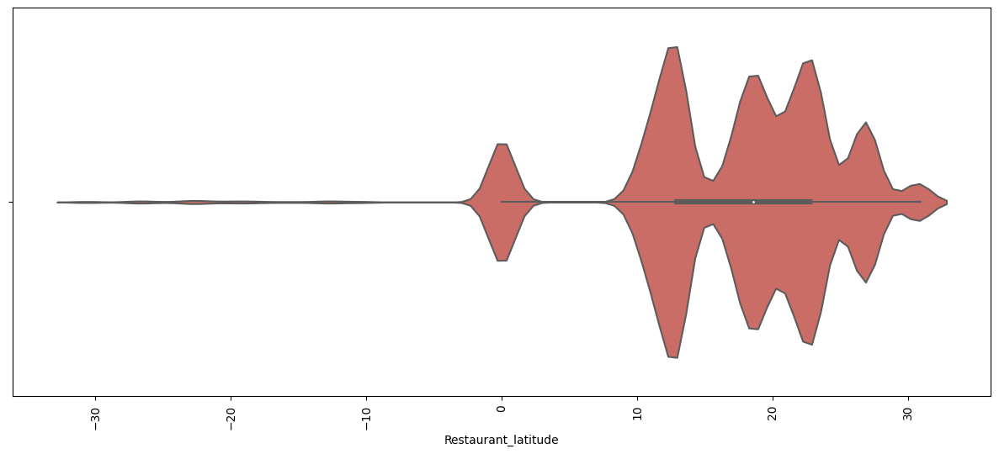

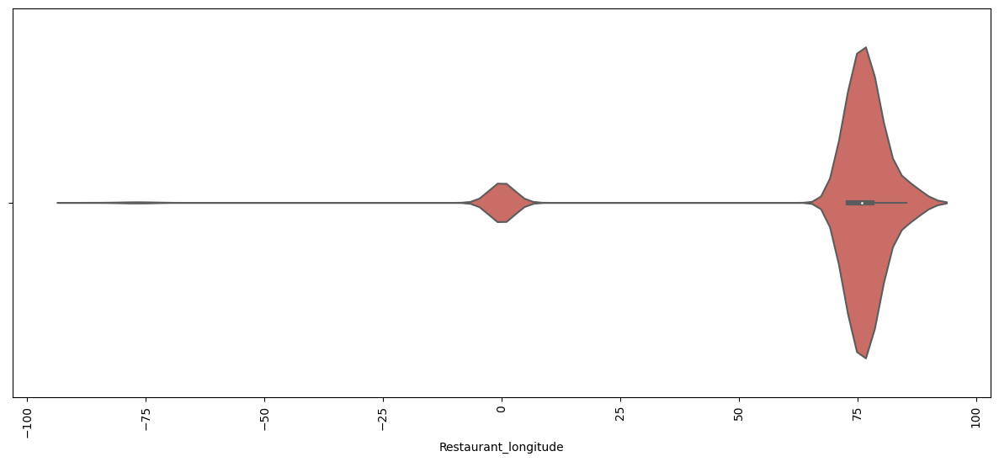

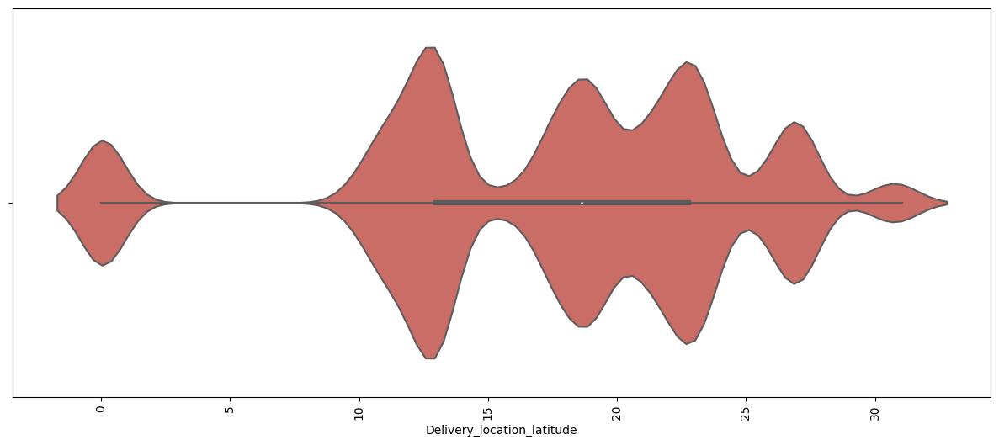

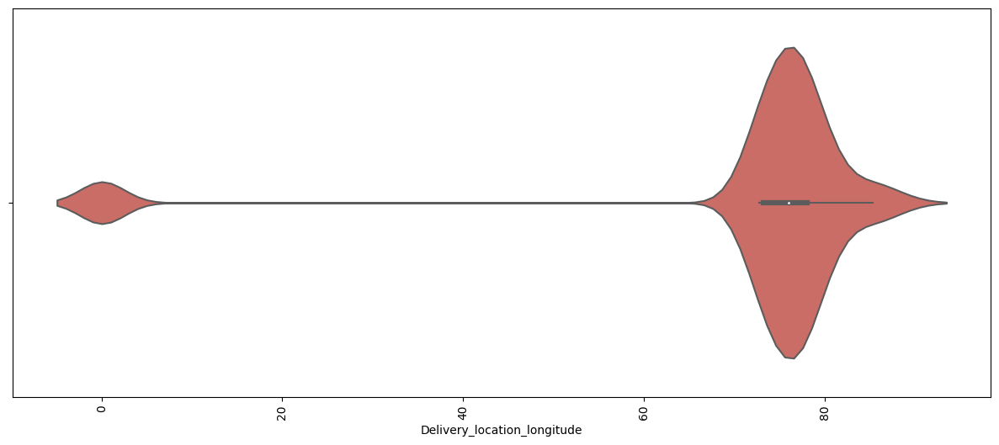

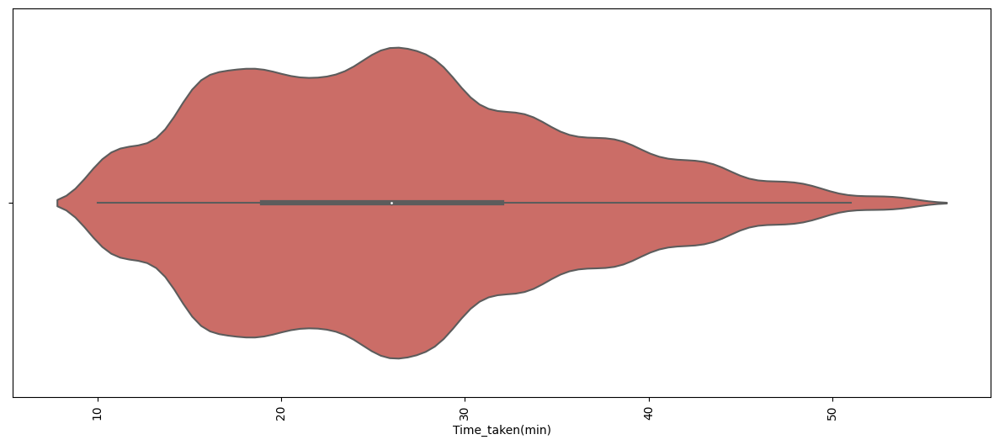

In [30]:
for i in numerical_columns:
    plt.figure(figsize=(15,6))
    sns.violinplot(x = i, data = df, palette = 'hls')
    plt.xticks(rotation = 90)
    plt.show()

In [31]:
import plotly.express as px

for column in numerical_columns:
    fig = px.histogram(df, x=column, nbins=20, histnorm='probability density')
    fig.update_layout(title=f"Histogram of {column}", xaxis_title=column, yaxis_title="Probability Density")
    fig.show()

In [32]:
for column in numerical_columns:
    fig = px.box(df, y=column)
    fig.update_layout(title=f"Box Plot of {column}", yaxis_title=column)
    fig.show()

In [33]:
for column in numerical_columns:
    fig = px.violin(df, y=column)
    fig.update_layout(title=f"Violin Plot of {column}", yaxis_title=column)
    fig.show()

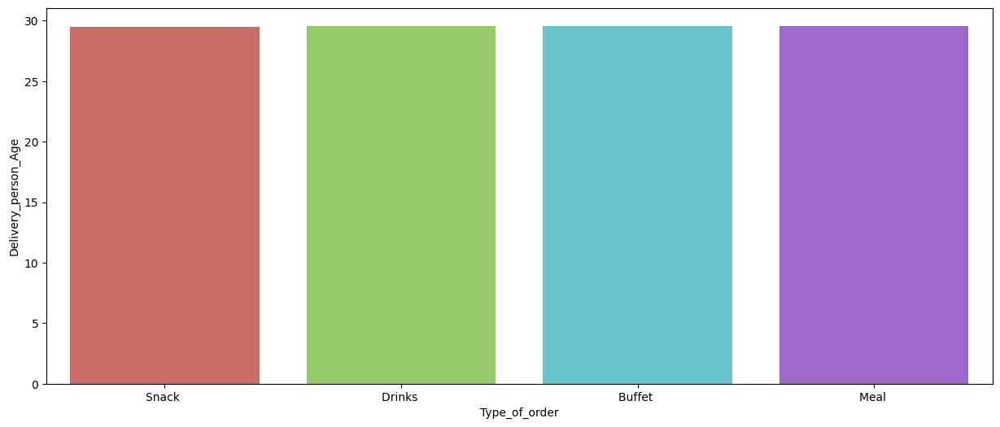

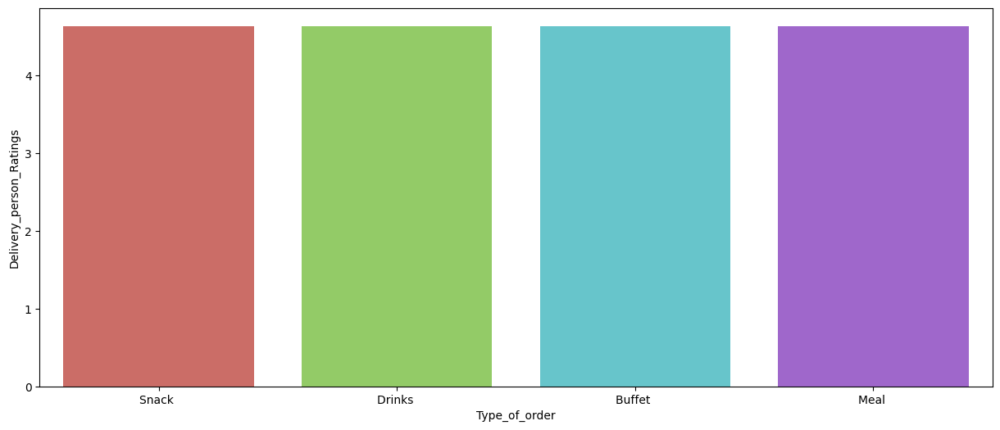

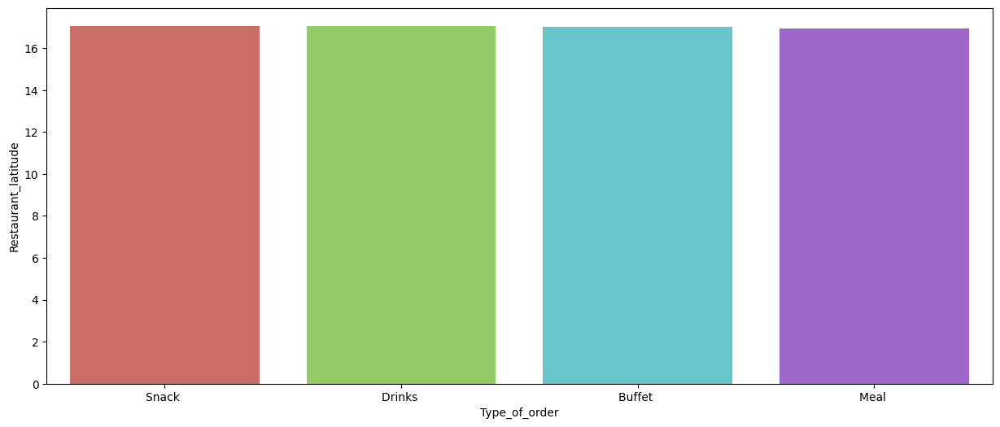

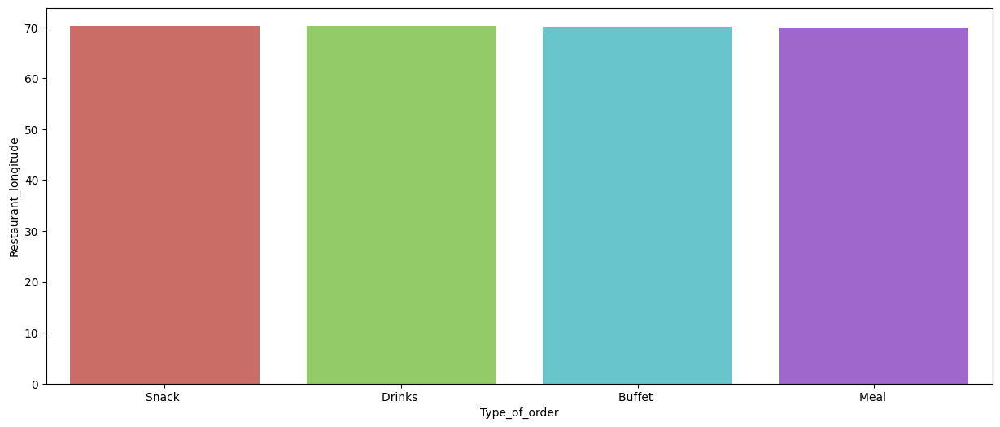

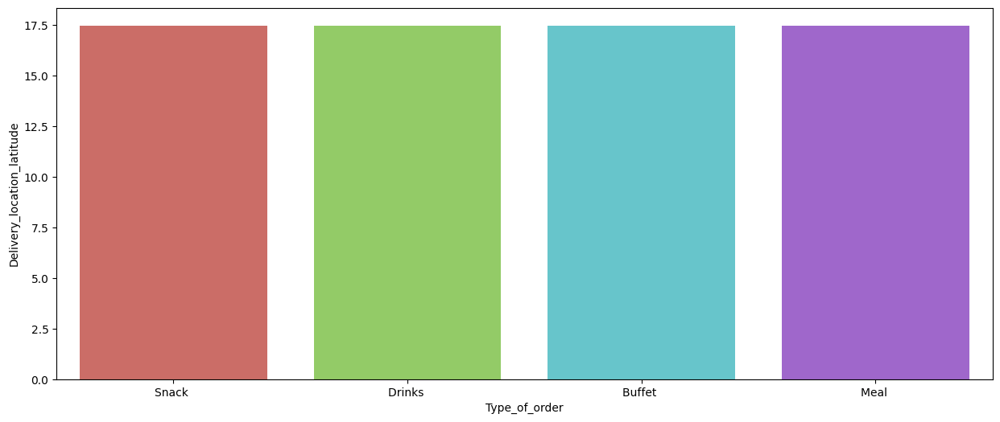

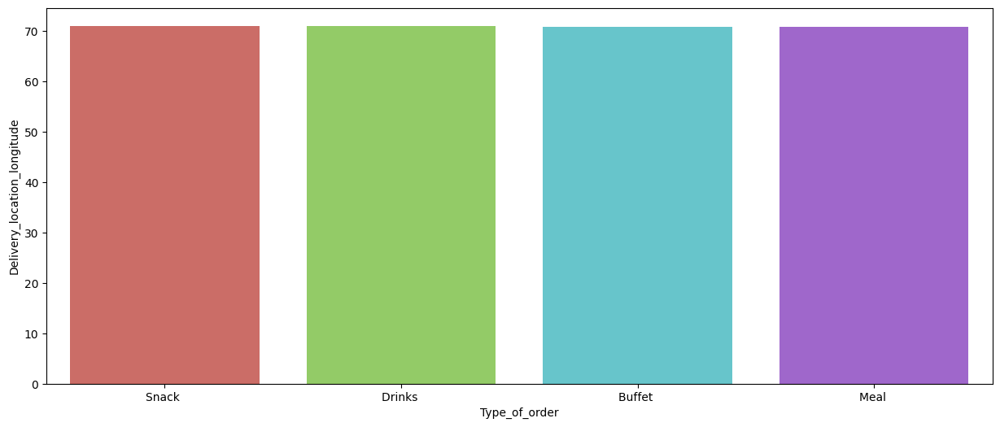

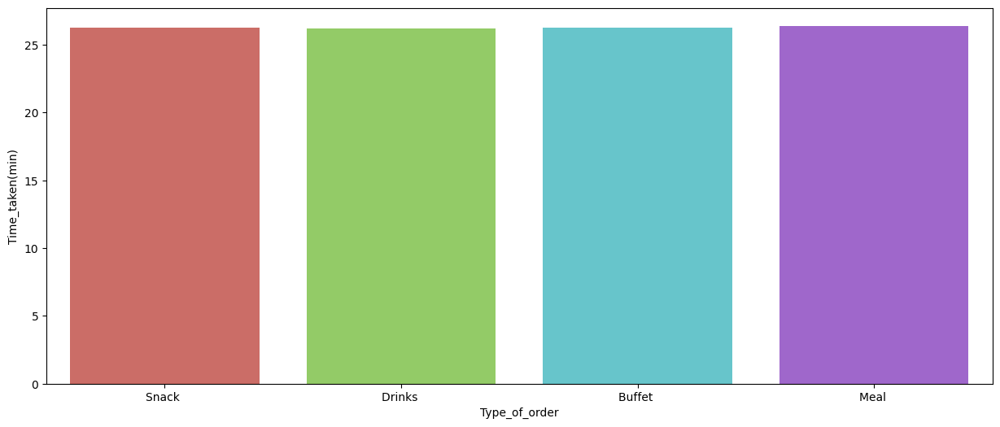

In [34]:
for i in numerical_columns:
    plt.figure(figsize=(15,6))
    sns.barplot(x = 'Type_of_order', y = df[i], data = df, ci = None, palette = 'hls')
    plt.show()

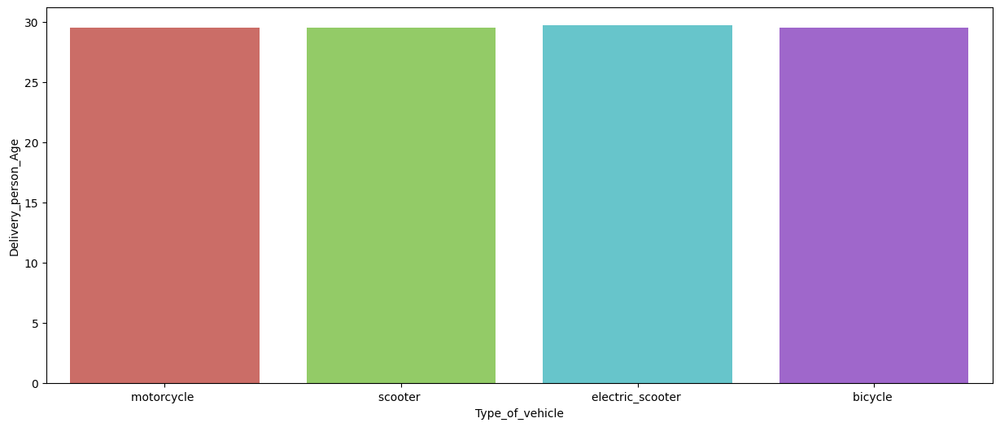

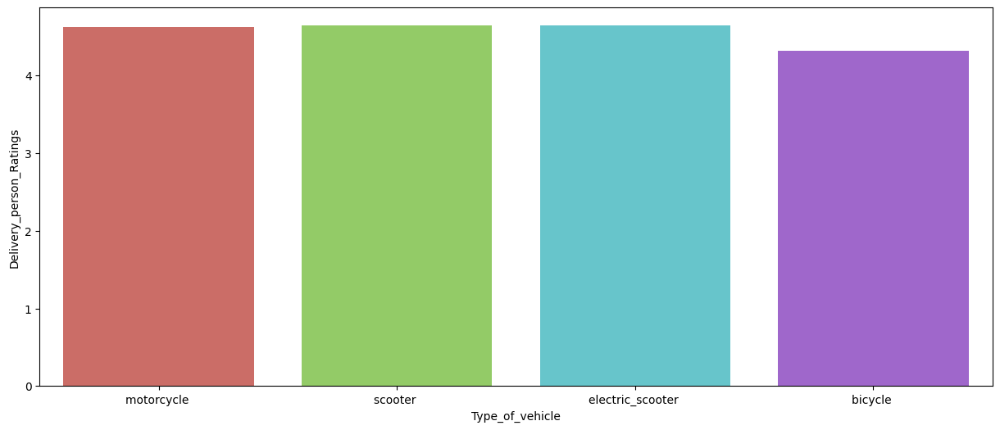

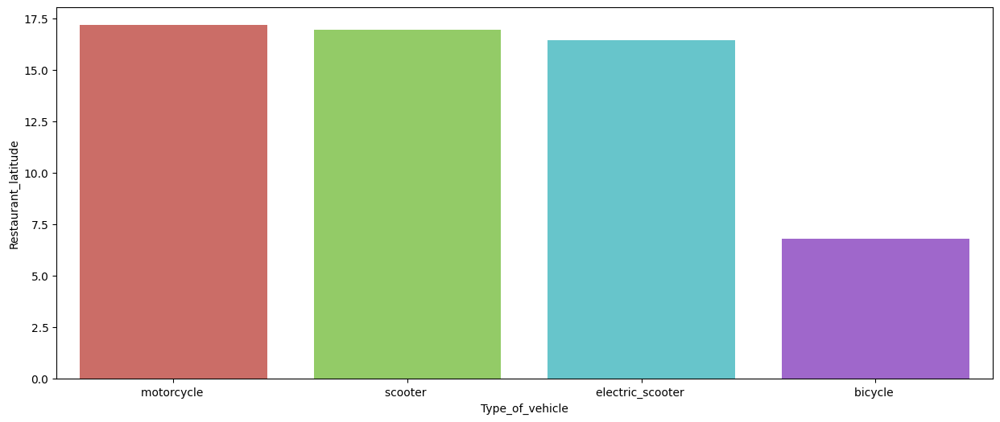

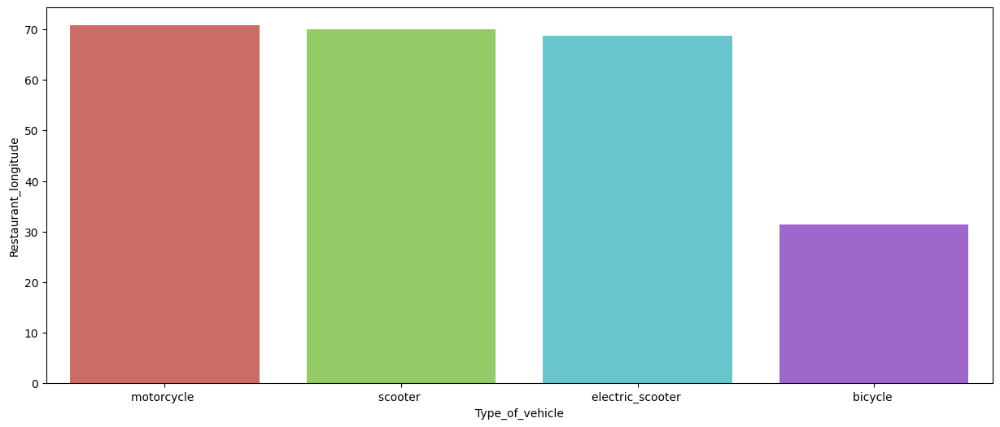

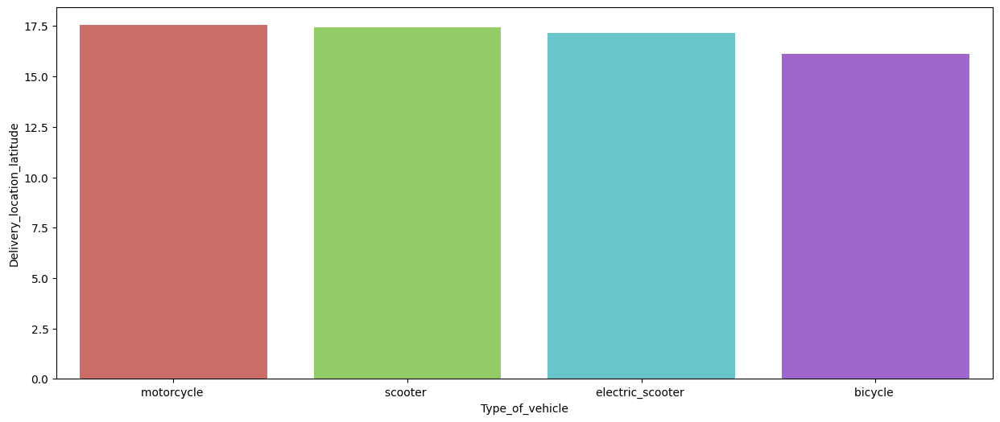

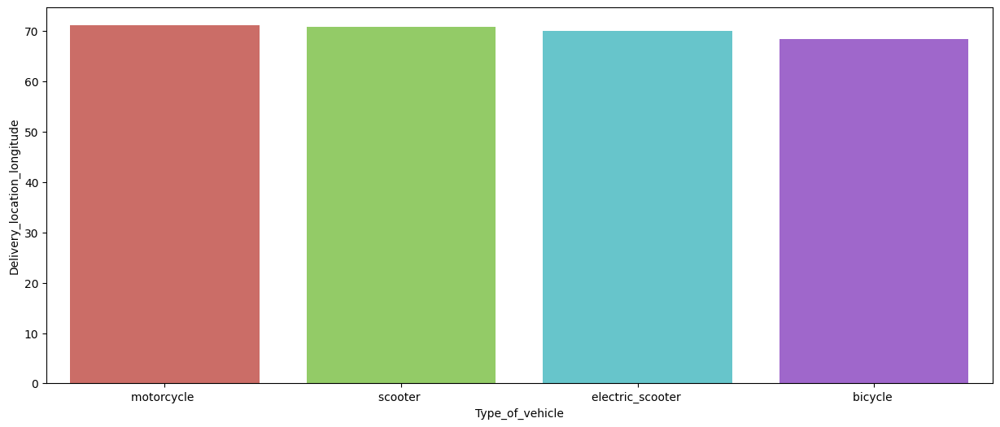

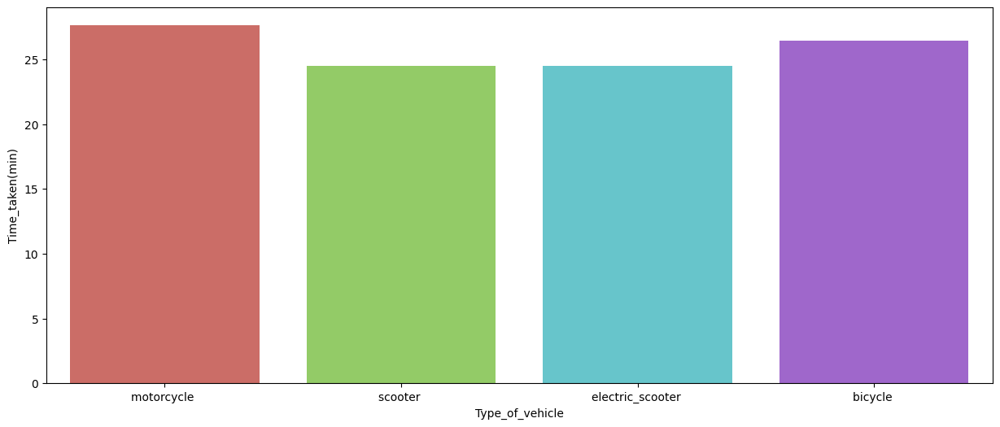

In [35]:
for i in numerical_columns:
    plt.figure(figsize=(15,6))
    sns.barplot(x = df['Type_of_vehicle'], y = df[i], data = df, ci = None, palette = 'hls')
    plt.show()

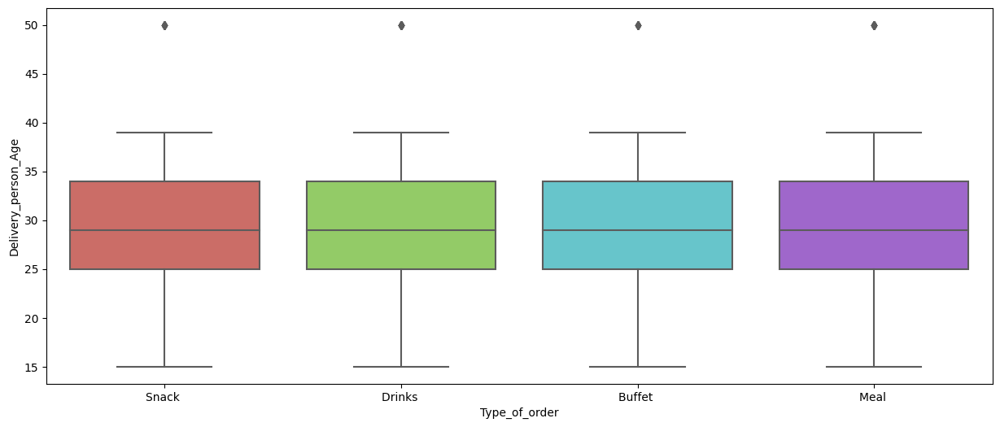

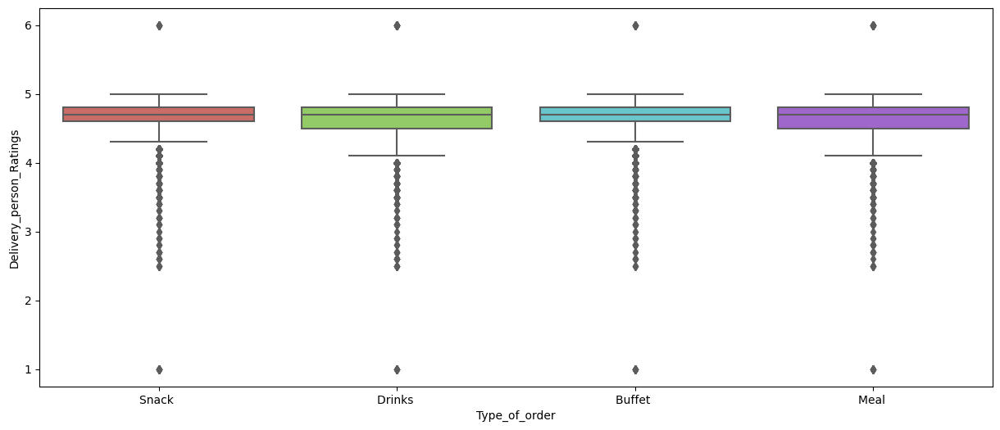

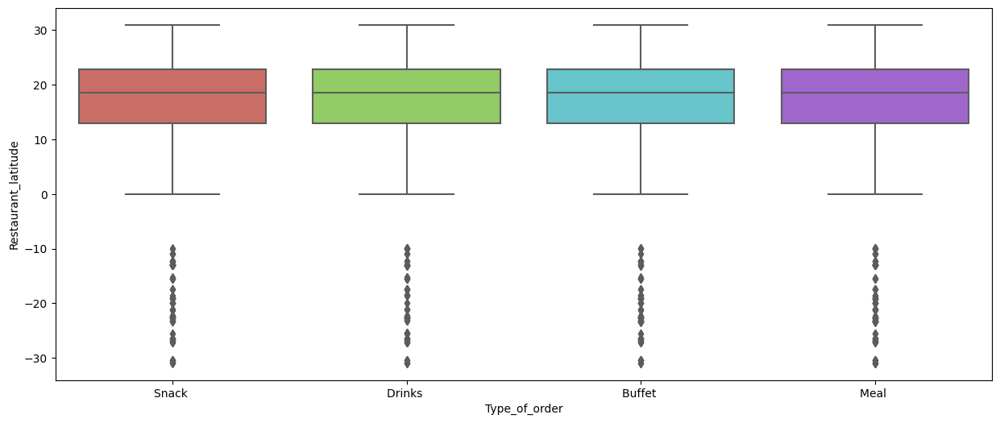

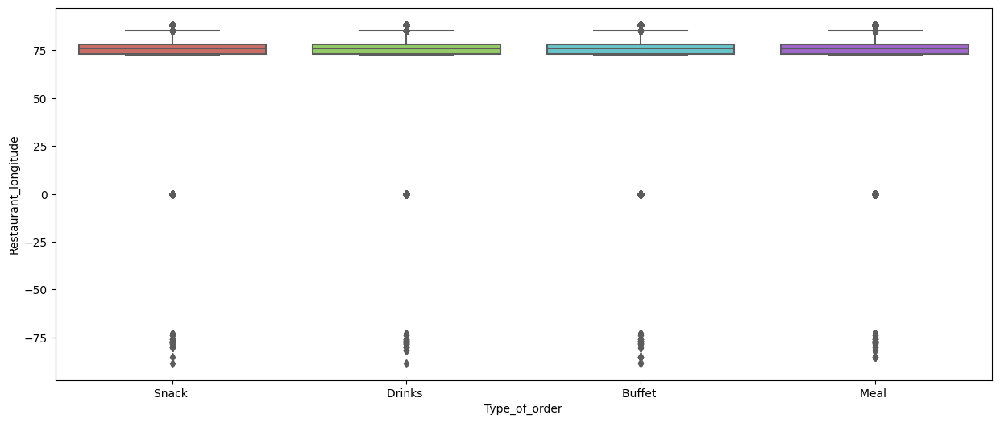

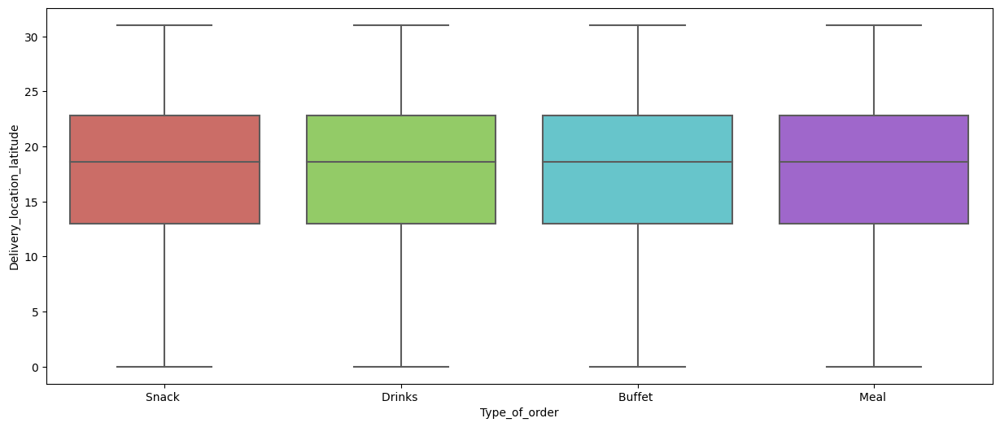

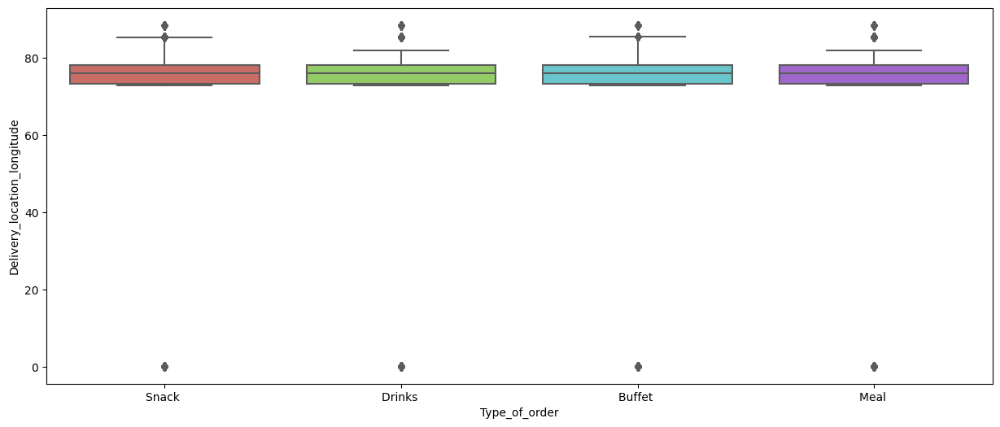

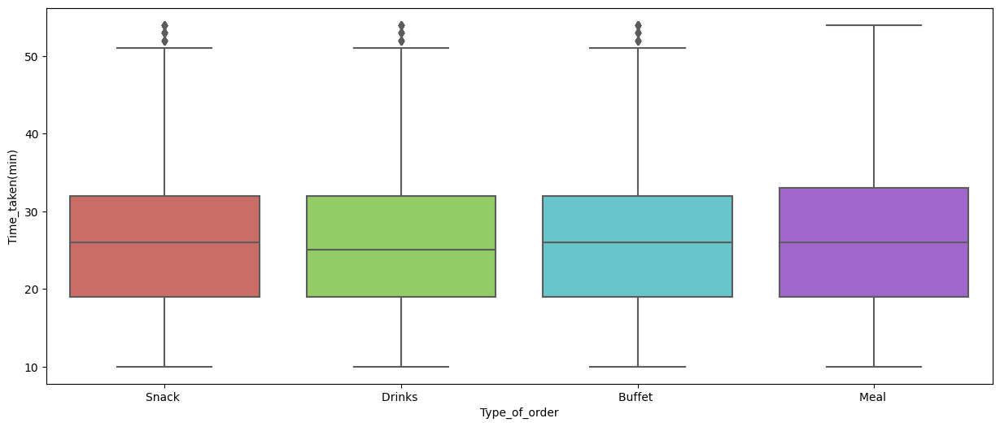

In [36]:
for i in numerical_columns:
    plt.figure(figsize=(15,6))
    sns.boxplot(x = df['Type_of_order'], y = df[i], data = df, palette = 'hls')
    plt.show()

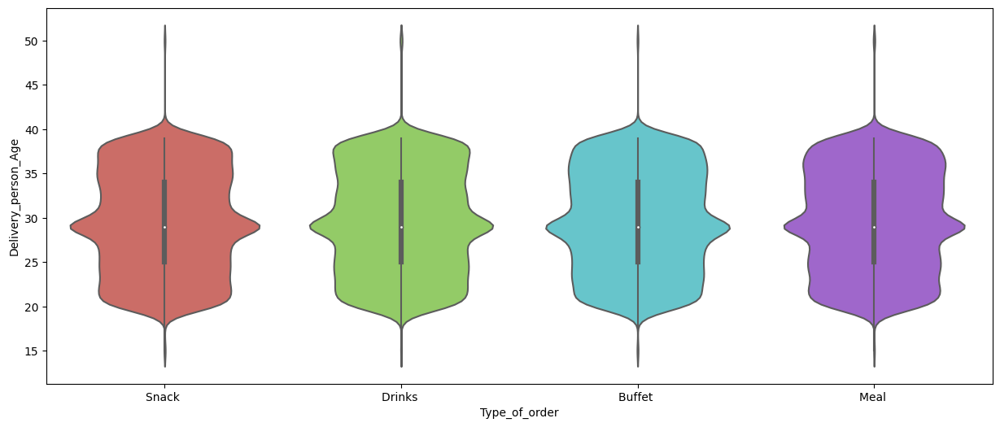

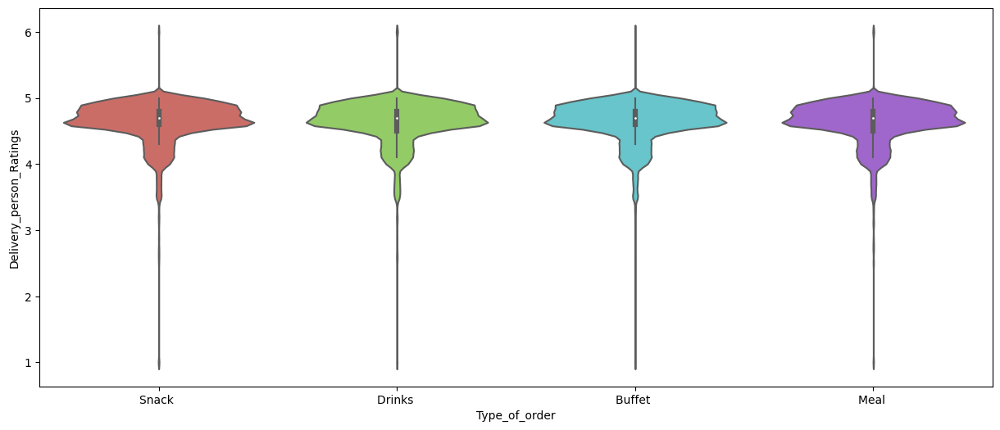

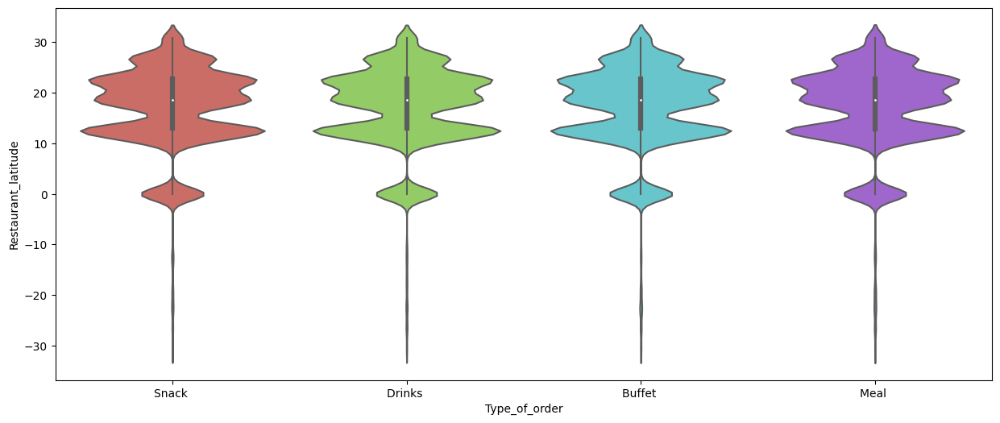

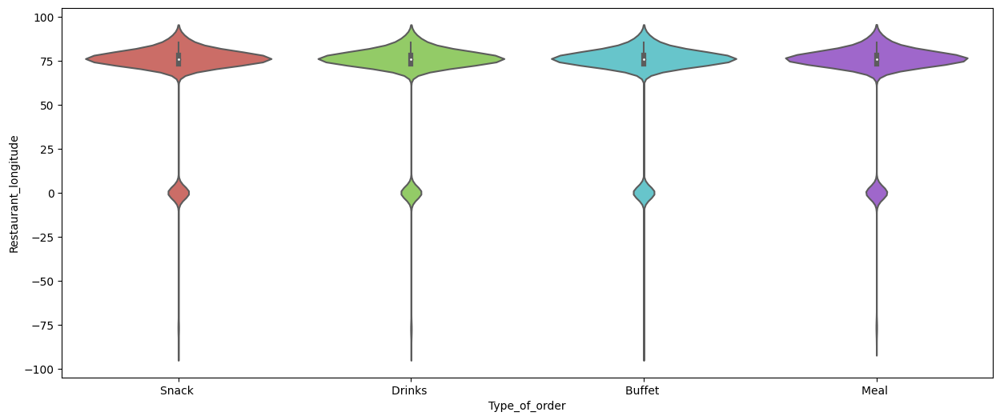

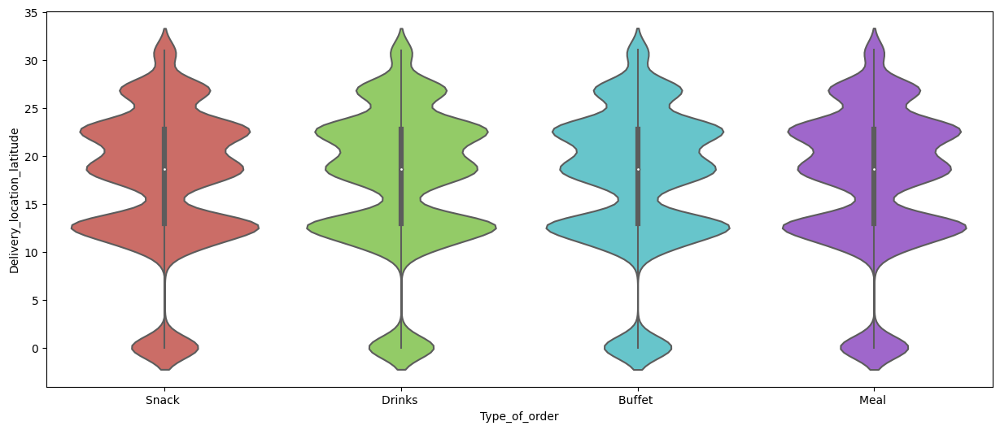

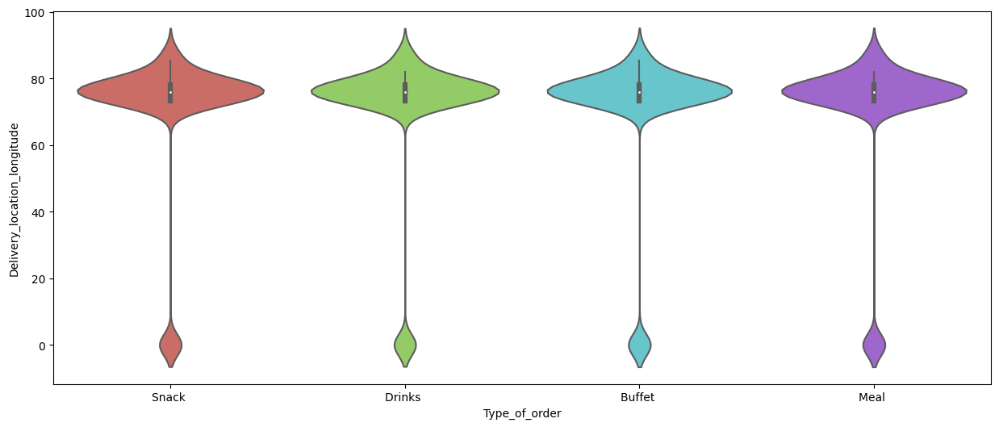

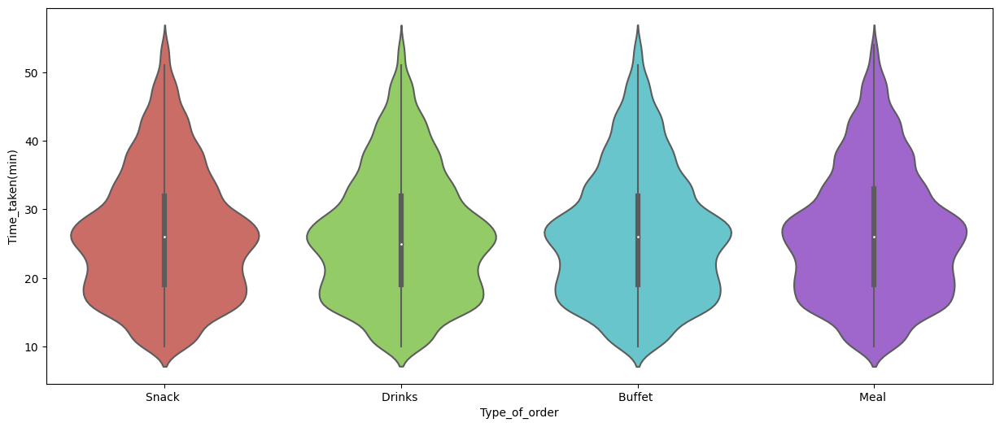

In [37]:
for i in numerical_columns:
    plt.figure(figsize=(15,6))
    sns.violinplot(x = df['Type_of_order'], y = df[i], data = df, palette = 'hls')
    plt.show()

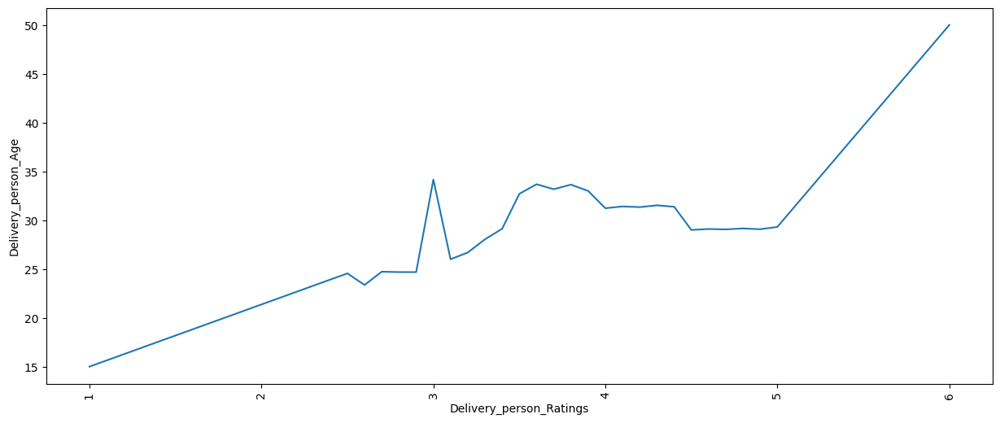

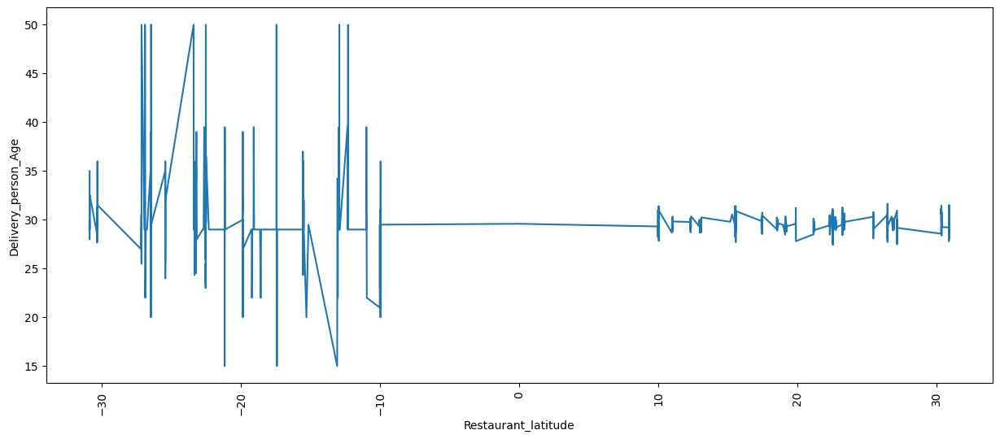

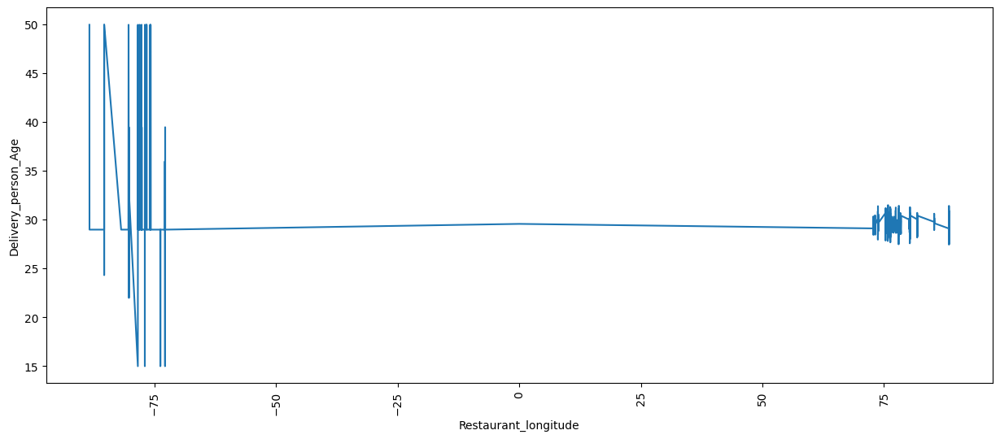

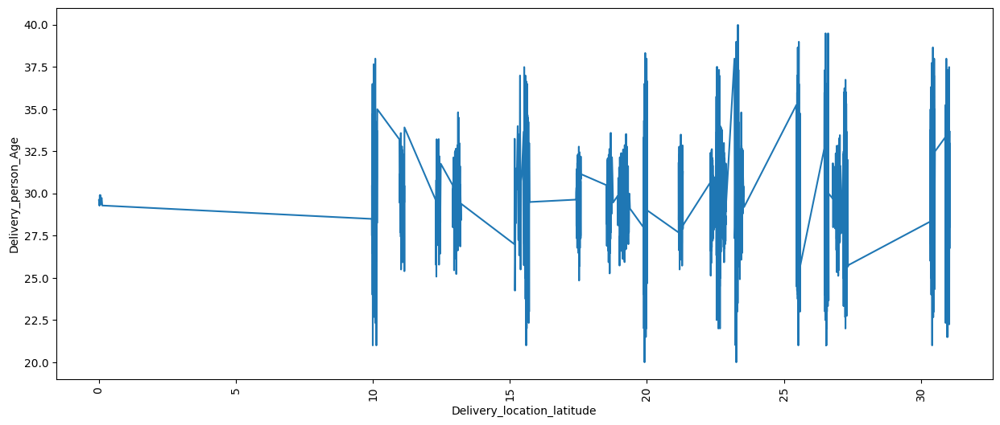

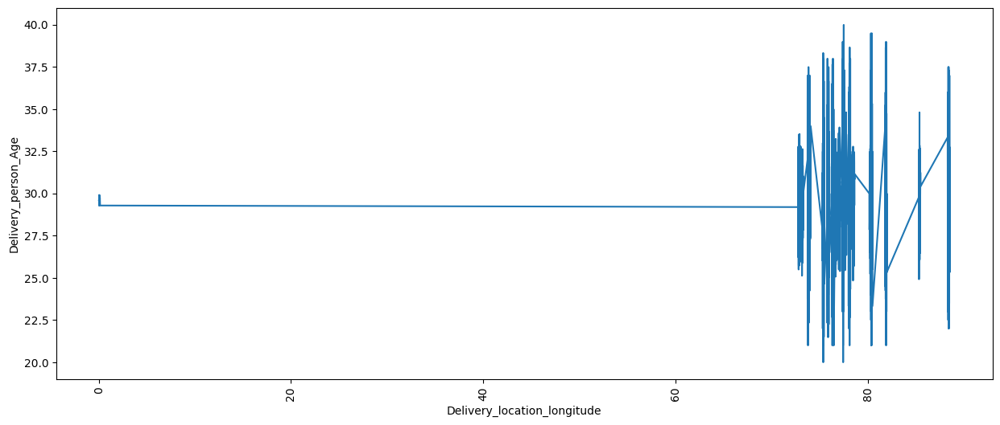

...

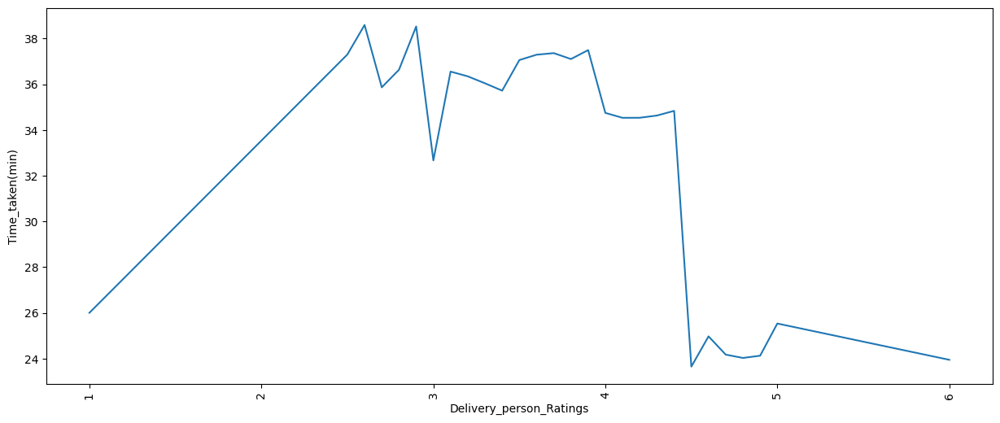

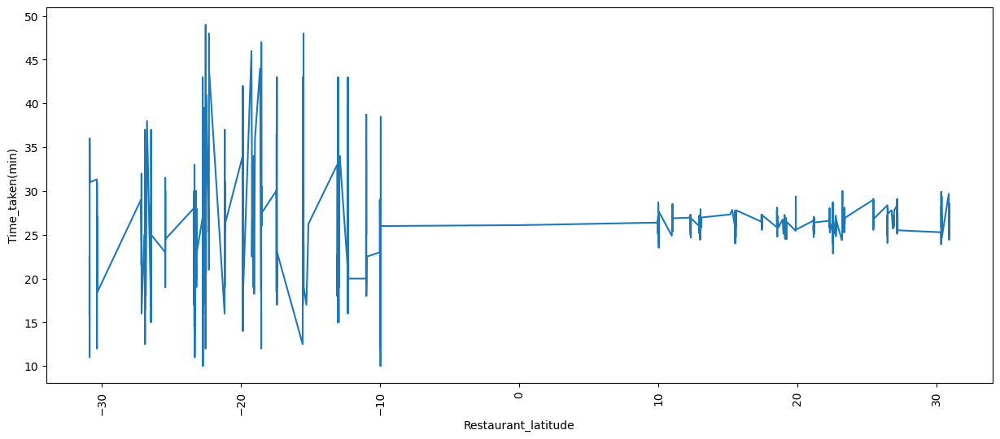

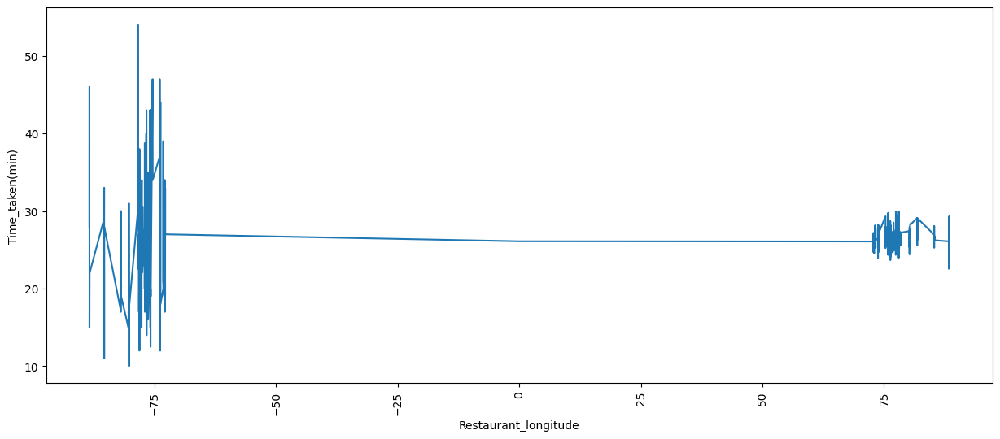

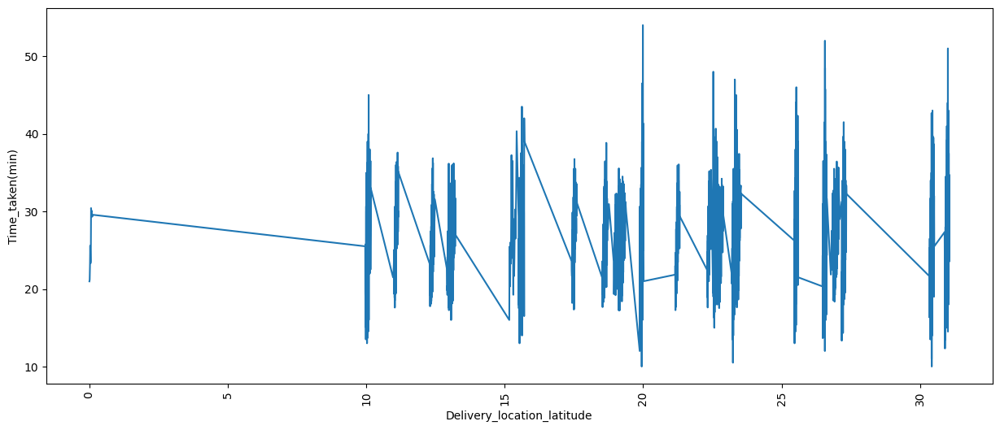

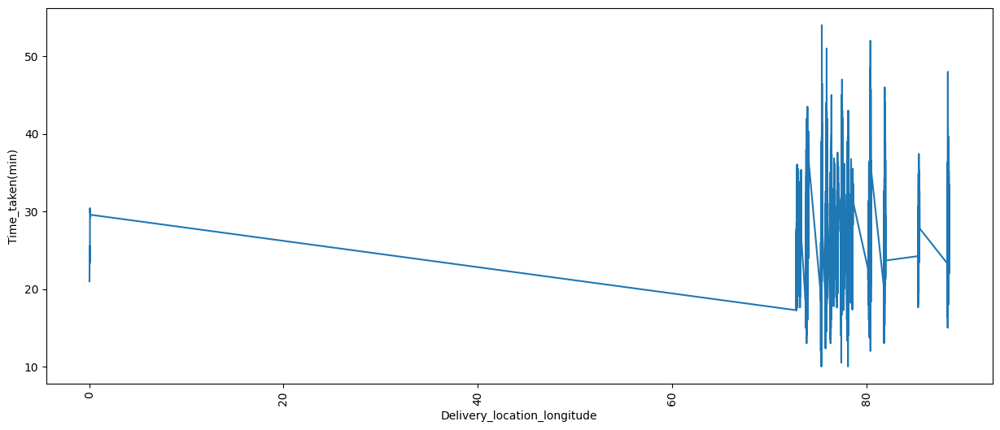

In [38]:
for i in numerical_columns:
    for j in numerical_columns:
        if i != j:
            plt.figure(figsize=(15,6))
            sns.lineplot(x = df[j], y = df[i], data = df, ci = None, palette = 'hls')
            plt.xticks(rotation = 90)
            plt.show()

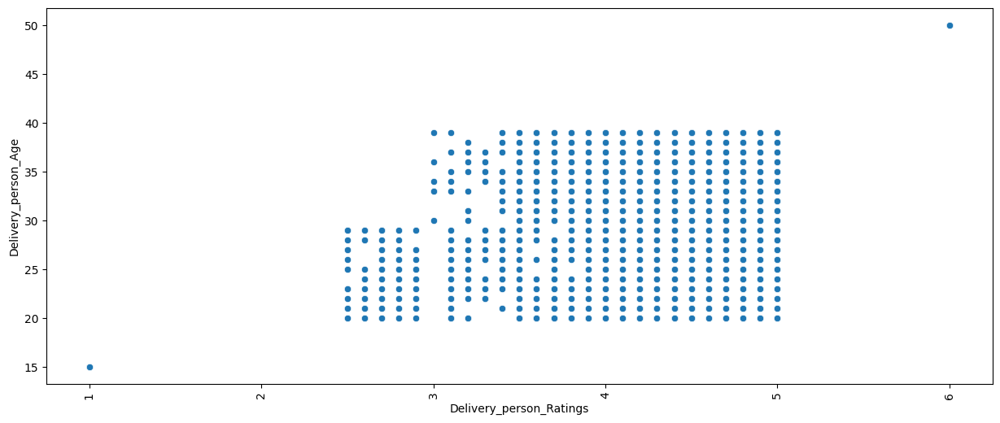

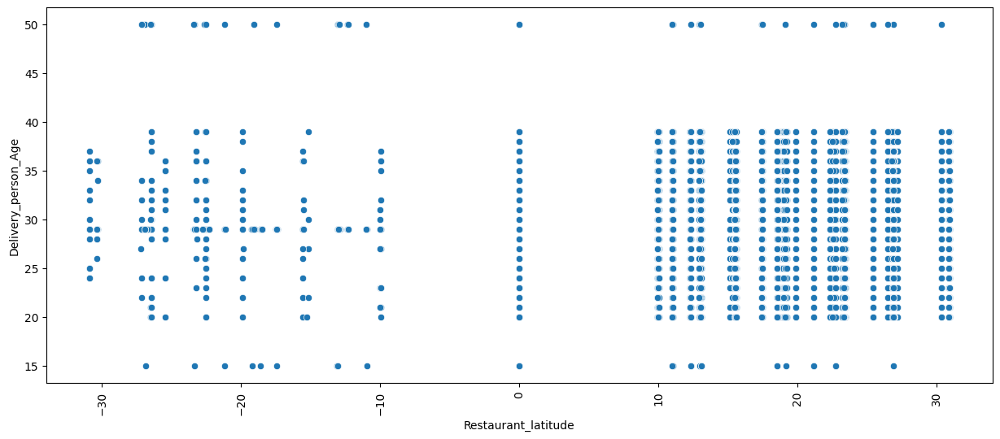

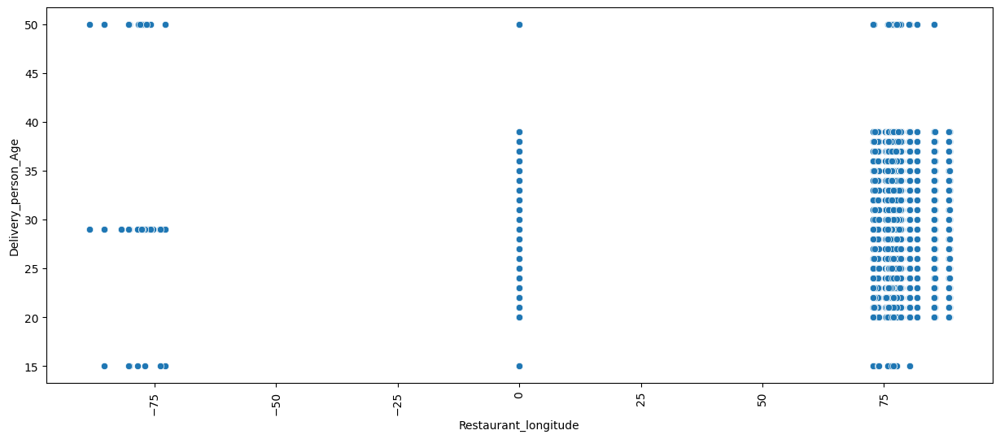

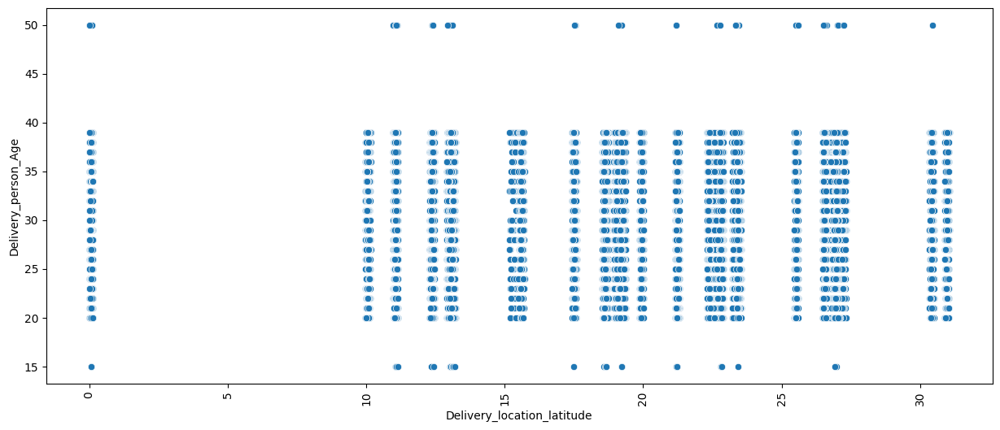

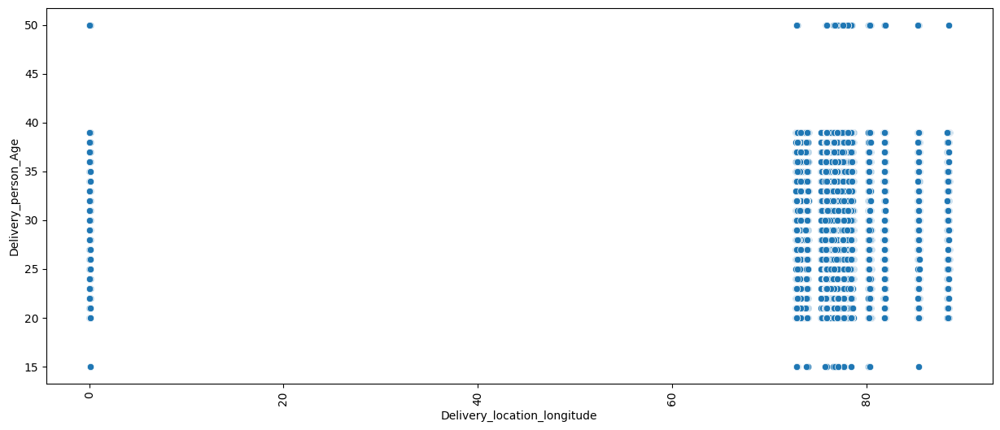

...

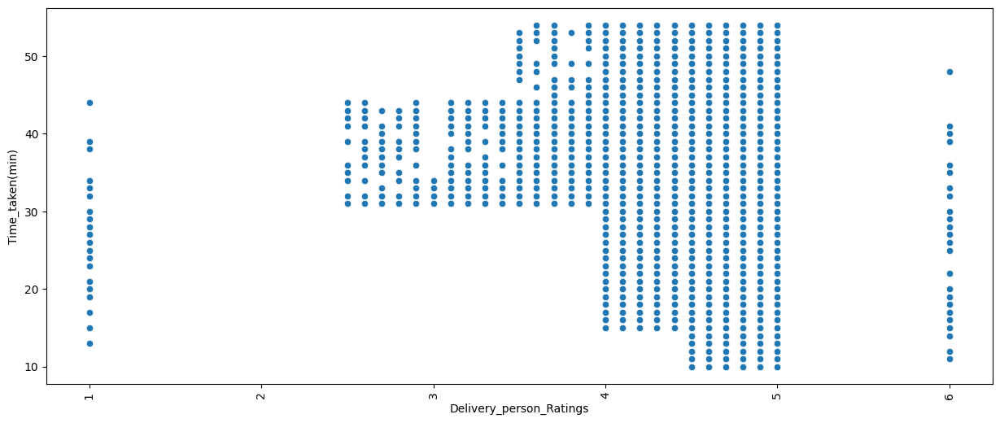

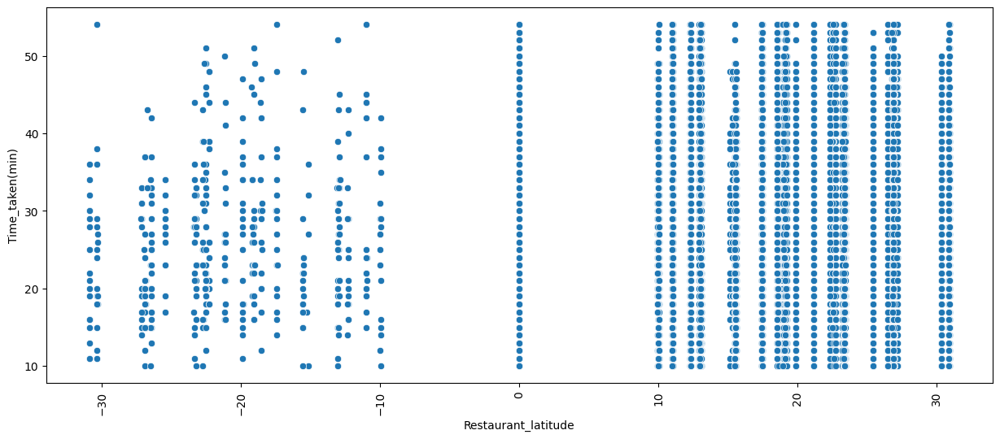

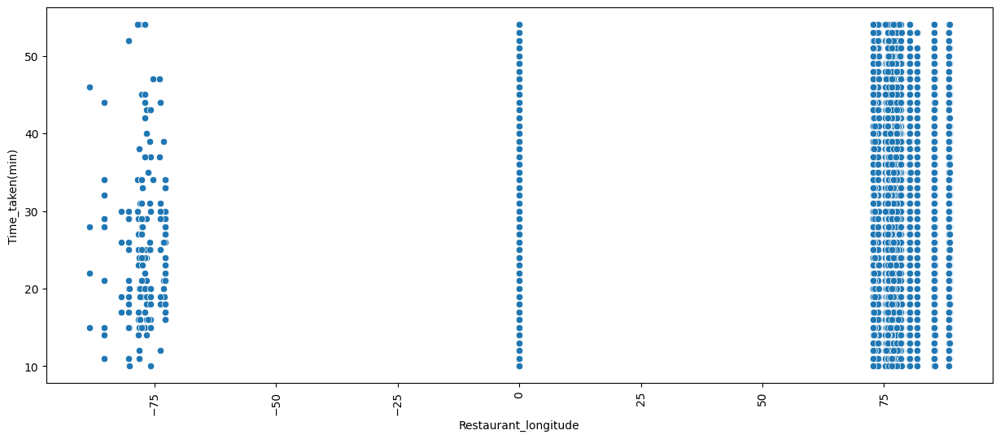

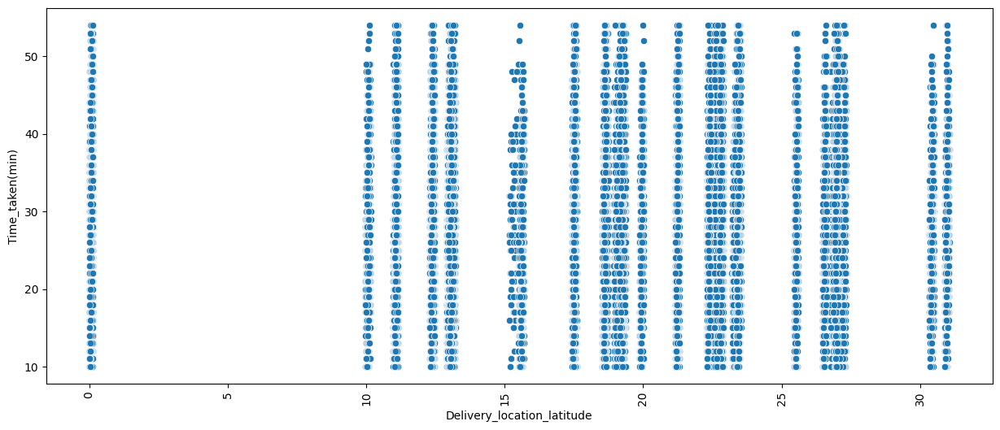

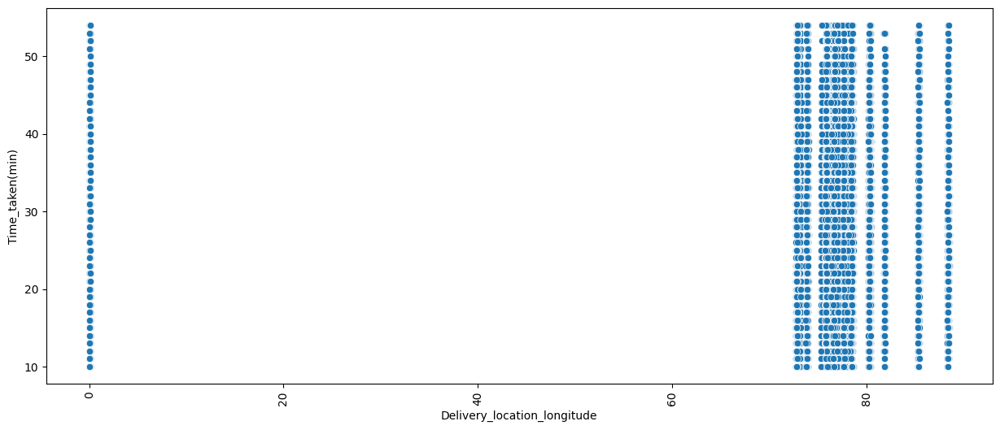

In [39]:
for i in numerical_columns:
    for j in numerical_columns:
        if i != j:
            plt.figure(figsize=(15, 6))
            sns.scatterplot(x=df[j], y=df[i], palette='hls')
            plt.xticks(rotation=90)
            plt.show()


In [40]:
df_corr = df.corr()

In [41]:
df_corr

,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Time_taken(min)
Delivery_person_Age,1.000000,-0.067449,-0.001955,-0.006796,0.002359,-0.000593,0.292708
Delivery_person_Ratings,-0.067449,1.000000,-0.004846,-0.011147,-0.010198,-0.013350,-0.331103
Restaurant_latitude,-0.001955,-0.004846,1.000000,0.661784,0.866378,0.602713,0.013981
Restaurant_longitude,-0.006796,-0.011147,0.661784,1.000000,0.632293,0.915026,0.007821
Delivery_location_latitude,0.002359,-0.010198,0.866378,0.632293,1.000000,0.690515,0.014243
Delivery_location_longitude,-0.000593,-0.013350,0.602713,0.915026,0.690515,1.000000,0.007625
Time_taken(min),0.292708,-0.331103,0.013981,0.007821,0.014243,0.007625,1.000000


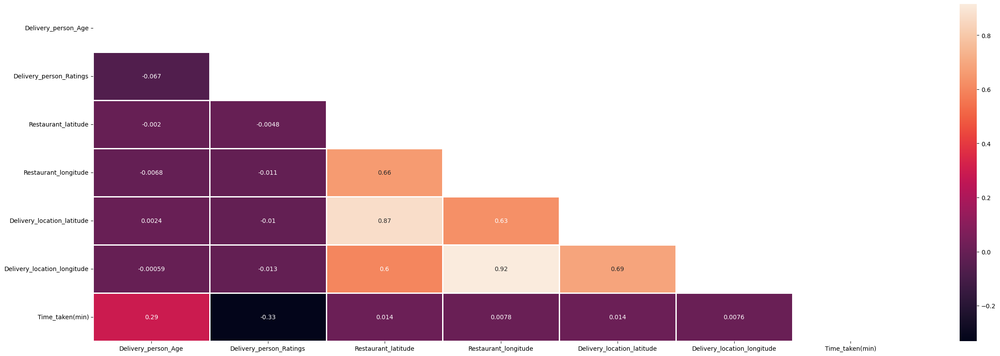

In [42]:
plt.figure(figsize=(30, 10))
matrix = np.triu(df_corr)
sns.heatmap(df_corr, annot=True, linewidth=.8, mask=matrix, cmap="rocket");
plt.show()

In [43]:
fig = go.Figure(data=go.Heatmap(
    z=df_corr.values,
    x=df_corr.columns,
    y=df_corr.index,
    colorscale='Viridis',  # Use a valid colorscale name
    colorbar=dict(title='Correlation')
))

fig.update_layout(
    title='Correlation Heatmap',
    xaxis=dict(title='X-axis labels'),
    yaxis=dict(title='Y-axis labels'),
    width=800,
    height=400,
    plot_bgcolor='white'
)

fig.show()

In [44]:
df

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Type_of_order,Type_of_vehicle,Time_taken(min)
0,4607,INDORES13DEL02,37,4.9,22.745049,75.892471,22.765049,75.912471,Snack,motorcycle,24
1,B379,BANGRES18DEL02,34,4.5,12.913041,77.683237,13.043041,77.813237,Snack,scooter,33
2,5D6D,BANGRES19DEL01,23,4.4,12.914264,77.678400,12.924264,77.688400,Drinks,motorcycle,26
3,7A6A,COIMBRES13DEL02,38,4.7,11.003669,76.976494,11.053669,77.026494,Buffet,motorcycle,21
4,70A2,CHENRES12DEL01,32,4.6,12.972793,80.249982,13.012793,80.289982,Snack,scooter,30
...,...,...,...,...,...,...,...,...,...,...,...
45588,7C09,JAPRES04DEL01,30,4.8,26.902328,75.794257,26.912328,75.804257,Meal,motorcycle,32
45589,D641,AGRRES16DEL01,21,4.6,0.000000,0.000000,0.070000,0.070000,Buffet,motorcycle,36
45590,4F8D,CHENRES08DEL03,30,4.9,13.022394,80.242439,13.052394,80.272439,Drinks,scooter,16
45591,5EEE,COIMBRES11DEL01,20,4.7,11.001753,76.986241,11.041753,77.026241,Snack,motorcycle,26


In [45]:
# Extracting Time Components
df['hour_of_day'] = pd.to_datetime(df['Time_taken(min)'], unit='m').dt.hour
df['day_of_week'] = pd.to_datetime(df['Time_taken(min)'], unit='m').dt.dayofweek
df['month_of_year'] = pd.to_datetime(df['Time_taken(min)'], unit='m').dt.month

In [46]:
import math

In [47]:
# Function to calculate distance between two sets of latitude and longitude coordinates
def calculate_distance(lat1, lon1, lat2, lon2):
    R = 6371  # Earth's radius in kilometers

    # Convert latitude and longitude from degrees to radians
    lat1_rad = math.radians(lat1)
    lon1_rad = math.radians(lon1)
    lat2_rad = math.radians(lat2)
    lon2_rad = math.radians(lon2)

    # Haversine formula to calculate distance
    dlat = lat2_rad - lat1_rad
    dlon = lon2_rad - lon1_rad
    a = math.sin(dlat/2) ** 2 + math.cos(lat1_rad) * math.cos(lat2_rad) * math.sin(dlon/2) ** 2
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1-a))
    distance = R * c

    return distance

# Calculate distance and create the distance feature
df['distance'] = df.apply(lambda row: calculate_distance(row['Restaurant_latitude'], row['Restaurant_longitude'],
                                                        row['Delivery_location_latitude'], row['Delivery_location_longitude']), axis=1)

In [48]:
# Categorizing Age
age_bins = [0, 30, 50, float('inf')]
age_labels = ['young', 'middle-aged', 'senior']
df['age_category'] = pd.cut(df['Delivery_person_Age'], bins=age_bins, labels=age_labels)

In [49]:
# Aggregating Ratings
df['avg_ratings'] = df.groupby('Delivery_person_ID')['Delivery_person_Ratings'].transform('mean')

In [50]:
# Binary Encoding
df = pd.get_dummies(df, columns=['Type_of_order', 'Type_of_vehicle'])

In [51]:
# Interaction Features
df['time_ratings_interaction'] = df['Time_taken(min)'] * df['Delivery_person_Ratings']

In [52]:
df

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Time_taken(min),hour_of_day,...,avg_ratings,Type_of_order_Buffet,Type_of_order_Drinks,Type_of_order_Meal,Type_of_order_Snack,Type_of_vehicle_bicycle,Type_of_vehicle_electric_scooter,Type_of_vehicle_motorcycle,Type_of_vehicle_scooter,time_ratings_interaction
0,4607,INDORES13DEL02,37,4.9,22.745049,75.892471,22.765049,75.912471,24,0,...,4.604839,0,0,0,1,0,0,1,0,117.6
1,B379,BANGRES18DEL02,34,4.5,12.913041,77.683237,13.043041,77.813237,33,0,...,4.653571,0,0,0,1,0,0,0,1,148.5
2,5D6D,BANGRES19DEL01,23,4.4,12.914264,77.678400,12.924264,77.688400,26,0,...,4.698182,0,1,0,0,0,0,1,0,114.4
3,7A6A,COIMBRES13DEL02,38,4.7,11.003669,76.976494,11.053669,77.026494,21,0,...,4.593443,1,0,0,0,0,0,1,0,98.7
4,70A2,CHENRES12DEL01,32,4.6,12.972793,80.249982,13.012793,80.289982,30,0,...,4.675439,0,0,0,1,0,0,0,1,138.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45588,7C09,JAPRES04DEL01,30,4.8,26.902328,75.794257,26.912328,75.804257,32,0,...,4.668333,0,0,1,0,0,0,1,0,153.6
45589,D641,AGRRES16DEL01,21,4.6,0.000000,0.000000,0.070000,0.070000,36,0,...,4.592308,1,0,0,0,0,0,1,0,165.6
45590,4F8D,CHENRES08DEL03,30,4.9,13.022394,80.242439,13.052394,80.272439,16,0,...,4.670455,0,1,0,0,0,0,0,1,78.4
45591,5EEE,COIMBRES11DEL01,20,4.7,11.001753,76.986241,11.041753,77.026241,26,0,...,4.612903,0,0,0,1,0,0,1,0,122.2


In [53]:
columns_to_drop = ['ID', 'Delivery_person_ID', 'Restaurant_latitude', 'Restaurant_longitude', 
                   'Delivery_location_latitude', 'Delivery_location_longitude']

In [54]:
# Drop the columns from the dataset
df = df.drop(columns=columns_to_drop)

In [55]:
df

,Delivery_person_Age,Delivery_person_Ratings,Time_taken(min),hour_of_day,day_of_week,month_of_year,distance,age_category,avg_ratings,Type_of_order_Buffet,Type_of_order_Drinks,Type_of_order_Meal,Type_of_order_Snack,Type_of_vehicle_bicycle,Type_of_vehicle_electric_scooter,Type_of_vehicle_motorcycle,Type_of_vehicle_scooter,time_ratings_interaction
0,37,4.9,24,0,3,1,3.025149,middle-aged,4.604839,0,0,0,1,0,0,1,0,117.6
1,34,4.5,33,0,3,1,20.183530,middle-aged,4.653571,0,0,0,1,0,0,0,1,148.5
2,23,4.4,26,0,3,1,1.552758,young,4.698182,0,1,0,0,0,0,1,0,114.4
3,38,4.7,21,0,3,1,7.790401,middle-aged,4.593443,1,0,0,0,0,0,1,0,98.7
4,32,4.6,30,0,3,1,6.210138,middle-aged,4.675439,0,0,0,1,0,0,0,1,138.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45588,30,4.8,32,0,3,1,1.489846,young,4.668333,0,0,1,0,0,0,1,0,153.6
45589,21,4.6,36,0,3,1,11.007735,young,4.592308,1,0,0,0,0,0,1,0,165.6
45590,30,4.9,16,0,3,1,4.657195,young,4.670455,0,1,0,0,0,0,0,1,78.4
45591,20,4.7,26,0,3,1,6.232393,young,4.612903,0,0,0,1,0,0,1,0,122.2


In [56]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45593 entries, 0 to 45592
Data columns (total 18 columns):
 #   Column                             Non-Null Count  Dtype   
---  ------                             --------------  -----   
 0   Delivery_person_Age                45593 non-null  int64   
 1   Delivery_person_Ratings            45593 non-null  float64 
 2   Time_taken(min)                    45593 non-null  int64   
 3   hour_of_day                        45593 non-null  int64   
 4   day_of_week                        45593 non-null  int64   
 5   month_of_year                      45593 non-null  int64   
 6   distance                           45593 non-null  float64 
 7   age_category                       45593 non-null  category
 8   avg_ratings                        45593 non-null  float64 
 9   Type_of_order_Buffet               45593 non-null  uint8   
 10  Type_of_order_Drinks               45593 non-null  uint8   
 11  Type_of_order_Meal                 45593 

In [57]:
df.columns

Index(['Delivery_person_Age', 'Delivery_person_Ratings', 'Time_taken(min)',
       'hour_of_day', 'day_of_week', 'month_of_year', 'distance',
       'age_category', 'avg_ratings', 'Type_of_order_Buffet ',
       'Type_of_order_Drinks ', 'Type_of_order_Meal ', 'Type_of_order_Snack ',
       'Type_of_vehicle_bicycle ', 'Type_of_vehicle_electric_scooter ',
       'Type_of_vehicle_motorcycle ', 'Type_of_vehicle_scooter ',
       'time_ratings_interaction'],
      dtype='object')

In [58]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder

In [59]:
features_to_scale = ['Delivery_person_Age', 'Delivery_person_Ratings', 'time_ratings_interaction']
features_not_to_scale = ['Time_taken(min)', 'hour_of_day', 'day_of_week', 'month_of_year', 'distance',
                         'age_category', 'avg_ratings', 'Type_of_order_Buffet ', 'Type_of_order_Drinks ',
                         'Type_of_order_Meal ', 'Type_of_order_Snack ', 'Type_of_vehicle_bicycle ',
                         'Type_of_vehicle_electric_scooter ', 'Type_of_vehicle_motorcycle ',
                         'Type_of_vehicle_scooter ']
target = 'Time_taken(min)'

In [60]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(df[features_to_scale + features_not_to_scale], df[target], test_size=0.25, random_state=42)

In [61]:
# Perform feature scaling for the appropriate features
scaler = StandardScaler()
X_train_scaled = X_train.copy()
X_test_scaled = X_test.copy()
X_train_scaled[features_to_scale] = scaler.fit_transform(X_train_scaled[features_to_scale])
X_test_scaled[features_to_scale] = scaler.transform(X_test_scaled[features_to_scale])

In [62]:
# Perform one-hot encoding for the 'age_category' feature
ct = ColumnTransformer(
    [('one_hot_encoder', OneHotEncoder(), ['age_category'])],
    remainder='passthrough'
)
X_train_scaled = ct.fit_transform(X_train_scaled)
X_test_scaled = ct.transform(X_test_scaled)

In [63]:
# Create and train the linear regression model
model_lr = LinearRegression()
model_lr.fit(X_train_scaled, y_train)

LinearRegression()

In [64]:
# Make predictions on the test set
y_pred = model_lr.predict(X_test_scaled)

In [65]:
# Evaluate the model using root mean squared error (RMSE)
rmse = mean_squared_error(y_test, y_pred, squared=False)
print('Root Mean Squared Error:', rmse)

Root Mean Squared Error: 2.341808939614661e-14


In [66]:
from sklearn.metrics import r2_score

In [67]:
# Calculate R-squared score
r2_lr = r2_score(y_test, y_pred)
print('R-squared Score:', r2_lr)

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)
print('Mean Squared Error:', mse)

R-squared Score: 1.0
Mean Squared Error: 5.484069109659143e-28


In [68]:
!pip install xgboost==1.7.6

You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.


In [69]:
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor

In [70]:
# Create and train the Decision Tree Regressor
dt_regressor = DecisionTreeRegressor(random_state=42)
dt_regressor.fit(X_train_scaled, y_train)

DecisionTreeRegressor(random_state=42)

In [71]:
# Make predictions on the test set using Decision Tree Regressor
y_pred_dt = dt_regressor.predict(X_test_scaled)

In [72]:
# Calculate R-squared score for Decision Tree Regressor
r2_dt = r2_score(y_test, y_pred_dt)
print('Decision Tree Regressor - R-squared Score:', r2_dt)

Decision Tree Regressor - R-squared Score: 1.0


In [73]:
# Calculate Mean Squared Error (MSE) for Decision Tree Regressor
mse_dt = mean_squared_error(y_test, y_pred_dt)
print('Decision Tree Regressor - Mean Squared Error:', mse_dt)

Decision Tree Regressor - Mean Squared Error: 0.0


In [74]:
# Create and train the XGBoost Regressor
xgb_regressor = XGBRegressor(random_state=42)
xgb_regressor.fit(X_train_scaled, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=42, ...)

In [75]:
# Make predictions on the test set using XGBoost Regressor
y_pred_xgb = xgb_regressor.predict(X_test_scaled)

In [76]:
# Calculate R-squared score for XGBoost Regressor
r2_xgb = r2_score(y_test, y_pred_xgb)
print('XGBoost Regressor - R-squared Score:', r2_xgb)

# Calculate Mean Squared Error (MSE) for XGBoost Regressor
mse_xgb = mean_squared_error(y_test, y_pred_xgb)
print('XGBoost Regressor - Mean Squared Error:', mse_xgb)

XGBoost Regressor - R-squared Score: 0.999999999991573
XGBoost Regressor - Mean Squared Error: 7.388065861443196e-10


<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=1856fb67-63bf-4505-a935-055e9e0b6193' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>